# Euro Data Cube: Use-case 02: LPIS

This notebook demonstrates how Euro Data Cube (EDC) tools can be utilized for an exploratory analysis and manipulation of data in Land Parcel Identification System (LPIS). The most important part is the example of using satellite imagery and machine learning algorithms to provide additional information about the area of interest, which should be a valuable support for decisions related with LPIS controls.

A workflow consist of three parts:
1. Prepare and explore LPIS data, reference land use data and satellite imagery
2. Run Machine Learning for Land Cover Land Use (LULC) prediction 
3. Visualize results and extract information to support LPIS controls

Step 2. is based on machine learning pipeline developed for LULC prediction in [Slovenia](https://eo-learn.readthedocs.io/en/latest/examples/land-cover-map/SI_LULC_pipeline.html). The workflow in this notebook is simplified and focused less on machine learning algorithm and more on usefulness of the results. It allows the user to change settings such as: area of interest, time range, mapping of classes.



## Requirements

### Sentinel Hub account

In order to run the example you'll need a Sentinel Hub account. If you do not have one yet, you can create a free trial account at [Sentinel Hub webpage](https://services.sentinel-hub.com/oauth/subscription). If you are a researcher you can even apply for a free non-commercial account at [ESA OSEO page](https://earth.esa.int/aos/OSEO).

Once you have the account set up, login to [Sentinel Hub Configurator](https://apps.sentinel-hub.com/configurator/). By default you will already have the default configuration with an **instance ID** (alpha-numeric code of length 36). For this tutorial we recommend that you create a new configuration (`"Add new configuration"`) and set the configuration to be based on **Python scripts template**. Such configuration will already contain all layers used in these examples. Otherwise you will have to define the layers for your configuration yourself.

After you have prepared a configuration please put configuration's **instance ID** into `sentinelhub` package's configuration file following the [configuration instructions](http://sentinelhub-py.readthedocs.io/en/latest/configure.html).

### AWS: S3 bucket, SentinelHub and database access parameters

You need to copy "config.template.py" file to "config.py" and then replace the placeholder values with your own database Amazon S3 and SentinelHub access parameters.

In [1]:
from config import *

In [2]:
!sentinelhub.config --instance_id 35e5eb0c-3b6a-40d9-8dca-31121465a55d 

### User constants

In [3]:
country_name = "slovenia"
country_crs_code = "EPSG:32633"
country_border_file = 'svn_buffered.geojson'

db_land_use_table = "land_use_slo"
db_land_use_class_column = "raba_id"
db_lpis_table = "lpis_slo"
db_lpis_class_column = "raba_id"

selected_db_records_time = '2019-09-30' # records that are used as a reference to compare with prediction
selected_patch_center = (15.1664, 46.2498) # (13.860377, 46.283196) # longitude, latitude
selected_patch_displayed_time = '2019-09-15' #User's input. Must be a value in cube.time

### Import packages

In [4]:
# Firstly, some necessary imports

# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import pickle
import sys
import os
import datetime
import time
import itertools
import math
import subprocess
import json
from geojson import Polygon as geoJsonPolygon
from enum import Enum

# interactive map
from ipyleaflet import Map as LeafletMap, Marker as LeafletMarker, Polygon as LeafletPolygon
from ipyleaflet import ImageOverlay as LeafletImageOverlay, DrawControl as LeafletDrawControl
from ipyleaflet import LayersControl as LeafletLayersControl, LayerGroup as LeafletLayerGroup
from ipyleaflet import basemaps, basemap_to_tiles

# Basics of Python data handling and visualization
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
from matplotlib.transforms import Bbox as plotBbox
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon
from tqdm import tqdm_notebook as tqdm

# Machine learning 
import lightgbm as lgb
from sklearn.externals import joblib
from sklearn import metrics
from sklearn import preprocessing

# Imports from eo-learn and sentinelhub-py
from eolearn.core import EOTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, \
  LoadFromDisk, SaveTask, EOExecutor
from eolearn.io import S2L1CWCSInput, ExportToTiff
from eolearn.mask import AddCloudMaskTask, get_s2_pixel_cloud_detector, AddValidDataMaskTask
from eolearn.geometry import VectorToRaster, PointSamplingTask, ErosionTask
from eolearn.features import LinearInterpolation, SimpleFilterTask
from sentinelhub import BBoxSplitter, BBox, CRS, CustomUrlParam, UtmGridSplitter

# OAuth2
from oauthlib.oauth2 import BackendApplicationClient
from requests_oauthlib import OAuth2Session

# DB and raw geometry
import psycopg2
from psycopg2._psycopg import AsIs
from psycopg2.extensions import register_adapter
import shapely.wkt
from shapely.geometry import Polygon, MultiPolygon
from geopandas import GeoDataFrame
import pyproj

# imports for xcube
import xarray as xr
import shapely.geometry
from shapely.ops import cascaded_union
import zarr

from xcube_sh.cube import open_cube
from xcube_sh.observers import Observers
from xcube_sh.config import CubeConfig
from xcube_sh.viewer import ViewerServer
import xcube.core.geom
import xcube.core.chunk

# Amazon S3
import boto3

/opt/conda/lib/python3.7/site-packages/pywt/_utils.py:6: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable
/opt/conda/lib/python3.7/site-packages/xcube_sh/cube.py:22: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Callable


In [5]:
os.system("taskset -p 0xff %d" % os.getpid())

0

## Mappings and colors

In [6]:
lulcMapping = {
    0: {"name": 'No Data', "color": [1.00, 1.00, 1.00]},
    1: {"name": 'Cultivated Land', "color": [0.75, 1.00, 0.00]},
    2: {"name": 'Forest', "color": [0.01, 0.21, 0.00]},
    3: {"name": 'Grassland', "color": [0.98, 0.45, 0.02]},
    4: {"name": 'Shrubland', "color": [0.82, 0.70, 0.44]},
    5: {"name": 'Water', "color": [0.02, 0.60, 0.95]},
    6: {"name": 'Wetlands', "color": [0.84, 1.00, 1.00]},
    7: {"name": 'Tundra', "color": [0.78, 0.62, 0.94]},
    8: {"name": 'Artificial Surface', "color": [0.55, 0.00, 0.06]},
    9: {"name": 'Bareland', "color": [0.90, 0.85, 0.65]},
    10: {"name": 'Snow and Ice', "color": [0.00, 0.00, 0.00]}
}
    
lulcColorMapping = {id: entry["color"] for id, entry in lulcMapping.items()}
lulcLegendTexts = {id: str(id) + " = " + entry["name"] for id, entry in lulcMapping.items()}

## mapping of land use classes into 10 classes that are to be predicted
lulcToLandUseMapping = {
    0: [0, 9999, 1411], # NOTE 1411 doesn't match any class
    1: [1100, 1150, 1160, 1161, 1170, 1180, 1181, 1190, 1191, 1192, 1211, 1212, 1221, 1222, 1230, 1240, 1610],
    2: [1420, 2000, 1907],
    3: [1130, 1131, 1300, 1320, 1321, 1330, 1600, 1906, 1800, 1430],
    4: [5000, 1500, 1410],
    5: [7000, 1905],
    6: [4100, 4210, 4220],
    7: [],
    8: [3000, 1902, 1903, 1904],
    9: [6000],
    10: []
}

landUseToLulcMapping = {landUse: lulc for lulc, landUseList in lulcToLandUseMapping.items() for landUse in landUseList}

landUseMapping = {
    1100: {"name": 'Arable land', "color": [0.60, 0.40, 0.40]},
    1130: {"name": 'Temporary grassland (not in use anymore)', "color": [0.11, 0.56, 0.56]},
    1131: {"name": 'Temporary grassland', "color": [0.11, 0.56, 0.56]},
    1150: {"name": 'Field for snail farming', "color": [0.60, 0.40, 0.40]},
    1160: {"name": 'Hop field', "color": [1.00, 0.20, 1.00]},
    1161: {"name": 'Hop field in rotation', "color": [1.00, 0.20, 1.00]},
    1170: {"name": 'Strawberry field', "color": [0.60, 0.40, 0.40]},
    1180: {"name": 'Permanent crops on arable land', "color": [1.00, 0.73, 0.60]},
    1181: {"name": 'Permanent crops on arable land where production is not in soil (not eligible)', "color": [1.00, 0.73, 0.60]},
    1190: {"name": 'Greenhouse', "color": [0.60, 0.40, 0.40]},
    1191: {"name": 'Greenhouse where production is not in soil (not eligible)', "color": [0.60, 0.40, 0.40]},
    1192: {"name": 'Greenhouse with fruit plants', "color": [1.00, 0.73, 0.60]},
    1211: {"name": 'Vineyard', "color": [1.00, 1.00, 0.20]},
    1212: {"name": 'Nursery', "color": [1.00, 0.68, 0.68]},
    1221: {"name": 'Intensive orchard', "color": [1.00, 0.73, 0.20]},
    1222: {"name": 'Extensive orchard', "color": [1.00, 0.60, 0.20]},
    1230: {"name": 'Olive grove', "color": [0.73, 0.73, 0.20]},
    1240: {"name": 'Other permanent crop', "color": [1.00, 0.73, 0.60]},
    1300: {"name": 'Permanent grassland', "color": [0.20, 1.00, 0.20]},
    1320: {"name": 'Permanent grassland with scattered ineligible features (Pro-rata)', "color": [0.20, 0.78, 0.80]},
    1321: {"name": 'Swampy meadows', "color": [0.04, 0.96, 0.85]},
    1330: {"name": 'Mountain pasture (not in use anymore)', "color": [0.50, 1.00, 0.20]},
    1410: {"name": 'Overgrown agricultural area', "color": [1.00, 0.37, 0.37]},
    1411: {"name": 'Area for removing overgrowth', "color": [0.21, 0.58, 0.45]},
    1420: {"name": 'Forest plantation', "color": [0.20, 0.80, 0.60]},
    1430: {"name": 'Extensive karst pasture', "color": [0.58, 0.98, 0.67]},
    1500: {"name": 'Trees and shrubs', "color": [0.15, 0.84, 0.24]},
    1600: {"name": 'Uncultivated agricultural land  ', "color": [0.50, 0.25, 0.25]},
    1610: {"name": 'Agricultural land being prepared for cultivation', "color": [0.20, 0.73, 0.20]},
    1800: {"name": 'Forest trees on agricultural land', "color": [0.15, 0.84, 0.24]},
    1902: {"name": 'Hayrack', "color": [0.72, 0.52, 0.05]},
    1903: {"name": 'Dirt road', "color": [0.85, 0.77, 0.65]},
    1904: {"name": 'Dry stone', "color": [0.75, 0.75, 0.75]},
    1905: {"name": 'Trench', "color": [0.75, 0.75, 0.75]},
    1906: {"name": 'Grassy border between fields', "color": [0.20, 1.00, 0.20]},
    1907: {"name": 'Trees in line', "color": [0.15, 0.84, 0.24]},
    2000: {"name": 'Forest', "color": [0.15, 0.84, 0.24]},
    3000: {"name": 'Built-up area and related surface', "color": [1.00, 0.20, 0.50]},
    4100: {"name": 'Swamp', "color": [0.04, 0.96, 0.85]},
    4210: {"name": 'Reed', "color": [0.04, 0.96, 0.85]},
    4220: {"name": 'Other marshy areas', "color": [0.04, 0.96, 0.85]},
    5000: {"name": 'Dried open area with special vegetation', "color": [0.50, 0.50, 1.00]},
    6000: {"name": 'Open area with little or no vegetation', "color": [0.84, 1.00, 0.67]},
    7000: {"name": 'Water', "color": [0.50, 1.00, 1.00]},
    9999: {"name": 'No data', "color": [0.00, 0.00, 0.00]}
}

landUseColorMapping = {id: entry["color"] for id, entry in landUseMapping.items()}
landUseLegendTexts = {id: str(id) + " = " + ((entry["name"][:15] + '..') if len(entry["name"]) > 15 else entry["name"]) for id, entry in landUseMapping.items()}

diffColorMapping = { # Blue through yellow to red
    -10: [0.19, 0.21, 0.58], 
    -9: [0.27, 0.29, 0.60], 
    -8: [0.35, 0.37, 0.62], 
    -7: [0.43, 0.45, 0.63], 
    -6: [0.52, 0.53, 0.65],
    -5: [0.60, 0.61, 0.67], 
    -4: [0.68, 0.68, 0.69], 
    -3: [0.76, 0.76, 0.70], 
    -2: [0.84, 0.84, 0.72], 
    -1: [0.92, 0.92, 0.74],
    0: [1.00, 1.00, 0.75], 
    1: [0.97, 0.90, 0.69], 
    2: [0.93, 0.80, 0.63], 
    3: [0.90, 0.70, 0.57], 
    4: [0.86, 0.60, 0.51],
    5: [0.83, 0.50, 0.45], 
    6: [0.80, 0.40, 0.39], 
    7: [0.76, 0.30, 0.33], 
    8: [0.73, 0.20, 0.27], 
    9: [0.69, 0.10, 0.21],
    10: [0.66, 0.00, 0.15]
}

## Database loading functionality

In [7]:
# needed for DB mapping
register_adapter(np.int64, AsIs)
register_adapter(Polygon, AsIs)
register_adapter(MultiPolygon, AsIs)

def loadFromDatabase(db_conn, taskName, tableName, landUseColumnName, recordId, bbox, crs, 
    dateFilterMin, dateFilterMax, maxRows = None, logging = True, mappedColumnName = None, mappingLambdaFunc = None):
    
    columns = ["id", "land_use", "geometry"]
    geometries = []

    if (mappedColumnName and mappingLambdaFunc):
        columns.append(mappedColumnName)

    with db_conn.cursor() as cur:
        sql = '''
            SELECT id, {landUseColumn}, ST_AsText(ST_Transform(geometry, {srid})) 
            FROM {tableName}
            WHERE 1=1
            '''

        sql = sql.format(tableName = tableName, landUseColumn = landUseColumnName, srid = crs.value)
        
        if not bbox is None:
            sql += " AND ST_Intersects(geometry, ST_Transform(ST_GeomFromText('{wkt}', {srid}), 3794))".format(wkt = bbox.get_geometry().wkt, srid = crs.value)
            
        if not dateFilterMin is None:
            sql += " AND d_update >= '{}'".format(dateFilterMin)
            
        if not dateFilterMax is None:
            sql += " AND d_update <= '{}'".format(dateFilterMax)
            
        if not recordId is None:
            sql += " AND id = {}".format(recordId)
        
        if not maxRows is None:
            sql += " LIMIT {}".format(maxRows)
            
        # print(sql)

        cur.execute(sql)
        for row in cur:
            properties = {"id": row[0], "land_use": row[1]}
            if (mappedColumnName and mappingLambdaFunc):
                properties[mappedColumnName] = mappingLambdaFunc(row[1])

            geometry = shapely.wkt.loads(row[2]);
            geometries.append({"geometry": geometry, "properties": properties})
            
        if logging and not bbox is None:
            print(taskName + ": " + str(len(geometries)) + ' DB records for bbox = ' + str(bbox))
            
        crs = {"init": "epsg:{}".format(crs.value)}
        return GeoDataFrame.from_features(geometries, crs = crs, columns = columns)

        
def loadFromDatabaseWithLulcMapping(db_conn, taskName, tableName, landUseColumnName, recordId, bbox, crs, 
    dateFilterMin, dateFilterMax, maxRows = None, logging = True):
    
    return loadFromDatabase(db_conn, taskName, tableName, landUseColumnName, recordId, bbox, crs, 
        dateFilterMin, dateFilterMax, maxRows, logging,
        "lulcid", lambda lulc: landUseToLulcMapping[lulc] if lulc in landUseToLulcMapping else 0)

## SentinelHub client functionality

In [8]:
class SentinelHubClient():
    def __init__(self, sh_oauth_session, s3_bucket):
        self.sh_oauth_session = sh_oauth_session
        self.s3_bucket = s3_bucket
        
    def getCollectionByName(self, name):
        try:
            url = "{base_url}/byoc/collections"
            url = url.format(base_url = sentinelhub_url)
            response = self.sh_oauth_session.get(url = url)
            response.raise_for_status()

            for collection_data in response.json()["data"]:
                if collection_data["name"] == name:
                    return collection_data["id"]
            return None
        except Exception as e:
            print(e)
            raise
    
    def createCollection(self, name):
        try:
            url = "{base_url}/byoc/collections"
            url = url.format(base_url = sentinelhub_url)
            response = self.sh_oauth_session.post(url = url, json = {'name': name, 's3Bucket': self.s3_bucket})
            response.raise_for_status()
            return response.json()["data"]["id"]
        except Exception as e:
            print(e)
            raise
            
    def getTileByPath(self, collection_id, s3_file_path):
        try:
            url = "{base_url}/byoc/collections/{collection_id}/tiles"
            url = url.format(base_url = sentinelhub_url, collection_id = collection_id)
            response = self.sh_oauth_session.get(url = url)
            response.raise_for_status()

            for tile_data in response.json()["data"]:
                if tile_data["path"] == s3_file_path:
                    return tile_data["id"]
            return None
        except Exception as e:
            print(e)
            raise
            
    def deleteTile(self, collection_id, tile_id):
        try:
            url = "{base_url}/byoc/collections/{collection_id}/tiles/{tile_id}"
            url = url.format(base_url = sentinelhub_url, collection_id = collection_id, tile_id = tile_id)
            response = self.sh_oauth_session.delete(url = url)
            response.raise_for_status()
        except Exception as e:
            print(e)
            raise
            
    def ingestTile(self, collection_id, s3_file_path, bbox):
        try:
            crs = {"type": "name", "properties": {"name": "urn:ogc:def:crs:EPSG::{}".format(bbox.get_crs().value)}}
            cover_geometry = geoJsonPolygon([bbox.get_polygon()], crs = crs)
            json = json = {"path": s3_file_path, "coverGeometry": cover_geometry, "tileGeometry": cover_geometry}
            
            url = "{base_url}/byoc/collections/{collection_id}/tiles"
            url = url.format(base_url = sentinelhub_url, collection_id = collection_id)
            response = self.sh_oauth_session.post(url = url, json = json)
            response.raise_for_status()
            tile_id = response.json()["data"]["id"]

            # wait until tile ingested
            url = "{base_url}/byoc/collections/{collection_id}/tiles/{tile_id}"
            url = url.format(base_url = sentinelhub_url, collection_id = collection_id, tile_id = tile_id)
            while True:
                response = self.sh_oauth_session.get(url = url)
                response.raise_for_status()
                status = response.json()["data"]["status"]
                if status != 'INGESTING' and status != 'WAITING':
                    if status == 'FAILED':
                        print("Failed to ingest tile " + s3_file_path + ": " + response.json()["data"]["failedIngestionCause"])
                    break
                time.sleep(1)
            
            return tile_id
        except Exception as e:
            print(e)
            raise

## Part 1: Exploratory Analysis

### Define the Area-of-Interest (AOI):

The whole territory of a country is splited into patches which makes the processing more efficient. The process is run on are of 3x3 patches for demonstration purposes.  AOI can be selected as the id of the patch in the middle.

Main steps in this part of the notebook:
* A geographical shape of Slovenia was taken from [Natural Earth database](http://www.naturalearthdata.com/downloads/10m-cultural-vectors/) and a buffer was applied. The shape is available in repository: `example_data/svn_buffered.geojson`
* Convert it to selected CRS: taken to be the CRS of central UTM tile (UTM_33N)
* Split it into smaller, manageable, non-overlapping rectangular tiles (patches)
* Select a small 3x3 area for classification

Be sure that your choice of CRS is the same as the CRS of your reference data.

In the case that you are having problems with empty data being downloaded, try changing the CRS to something that suits the location of the AOI better.

/opt/conda/lib/python3.7/site-packages/pyproj/crs.py:114: DeprecationWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  DeprecationWarning,


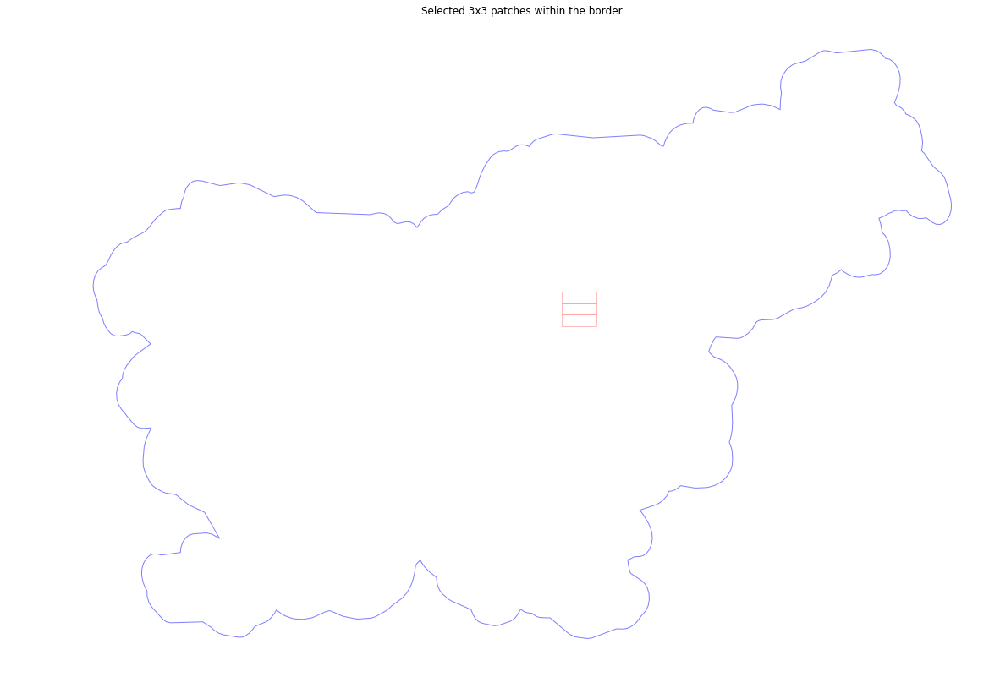

In [9]:
country_crs = CRS(country_crs_code)

# Folder where data for running the notebook is stored
DATA_FOLDER = os.path.join('example_data')

# Load geojson file
country = gpd.read_file(os.path.join(DATA_FOLDER, country_border_file))

# Convert CRS
country = country.to_crs(crs={'init': CRS.ogc_string(country_crs)})

# Get the country's shape in polygon format
country_shape = country.geometry.values[-1]

# Create the splitter to obtain a list of bboxes
use_smaller_patches = True
bbox_splitter_large = BBoxSplitter([country_shape], country_crs, (25, 17))
bbox_splitter_small = BBoxSplitter([country_shape], country_crs, (25 * 3, 17 * 3))

bbox_splitter = bbox_splitter_small if use_smaller_patches else bbox_splitter_large
bbox_list_aligned = [BBox((10 * math.floor(bbox.min_x / 10), 10 * math.floor(bbox.min_y / 10), 
                           10 * math.floor(bbox.max_x / 10), 10 * math.floor(bbox.max_y / 10)), country_crs) 
                     for bbox in bbox_splitter.get_bbox_list()]

bbox_list = np.array(bbox_list_aligned)
info_list = np.array(bbox_splitter.get_info_list())


# For the future examples, we will be using a specific set of patches,
# Select a central patch

from_wgs84_transformer = pyproj.Transformer.from_crs(str(CRS.WGS84), str(country_crs), always_xy=True)
center_x, center_y = from_wgs84_transformer.transform(selected_patch_center[0], selected_patch_center[1])

def bboxContains(bbox, x, y):
    return (x >= bbox.min_x) and (x < bbox.max_x) and (y >= bbox.min_y) and (y < bbox.max_y)

# find index of the patch that contains user-defined central coordinate
center_patch_index = next((index for index, bbox in enumerate(bbox_list) if bboxContains(bbox, center_x, center_y)), None)

# Obtain surrounding patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[center_patch_index]['index_x']) <= 1 and
        abs(info['index_y'] - info_list[center_patch_index]['index_y']) <= 1):
        patchIDs.append(idx)

# Check if final size is 3x3
if len(patchIDs) < 9:
    print('Warning! Use a different central patch ID, this one is on the border.')
    
# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(3, 3))).ravel()

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
idxs_x = [info['index_x'] for info in info_list[patchIDs]]
idxs_y = [info['index_y'] for info in info_list[patchIDs]]

gdf = gpd.GeoDataFrame({'index_x': idxs_x, 'index_y': idxs_y}, 
                       crs={'init': CRS.ogc_string(country_crs)}, 
                       geometry=geometry)

## NOTE: save to shapefile, uncomment if needed
# shapefile_name = './selected_3x3_bboxes_' + country_name + '_small.shp' if use_smaller_patches \
#    else './selected_3x3_bboxes_' + country_name + '_large.shp'
# gdf.to_file(shapefile_name)

# Visualize the selection
poly = gdf['geometry'][0]
x1, y1, x2, y2 = poly.bounds
aspect_ratio = (y1 - y2) / (x1 - x2)

fontdict = {'family': 'monospace', 'weight': 'normal', 'size': 11}

# if bboxes have all same size, estimate offset
xl, yl, xu, yu = gdf.geometry[0].bounds
xoff, yoff = (xu - xl) / 3, (yu - yl) / 5

# figure
fig, ax = plt.subplots(figsize=(20, 20));
gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5);
country.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5);
ax.set_title('Selected 3x3 patches within the border');
plt.axis('off');

### Visualization of land use (reference) data in selected AOI

In [10]:
# Rearange selected EOPatches into bbox, which can be used for xcube definition
patches_geometries = [Polygon(bbox.transform(CRS.WGS84).get_polygon()) for bbox in bbox_list[patchIDs]]
bbox_of_patches = gpd.GeoSeries(cascaded_union(patches_geometries))

x1 = bbox_of_patches.bounds['minx'][0].item()
y1 = bbox_of_patches.bounds['miny'][0].item()
x2 = bbox_of_patches.bounds['maxx'][0].item()
y2 = bbox_of_patches.bounds['maxy'][0].item()
total_bbox_wgs84 = x1, y1, x2, y2

/opt/conda/lib/python3.7/site-packages/pyproj/crs.py:114: DeprecationWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  DeprecationWarning,


In [11]:
# Rearange selected EOPatches into bbox, which can be used for xcube definition
patches_geometries = [Polygon(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
bbox_of_patches = gpd.GeoSeries(cascaded_union(patches_geometries))

x1 = bbox_of_patches.bounds['minx'][0].item()
y1 = bbox_of_patches.bounds['miny'][0].item()
x2 = bbox_of_patches.bounds['maxx'][0].item()
y2 = bbox_of_patches.bounds['maxy'][0].item()
total_bbox = x1, y1, x2, y2

#### Land use (reference) data for selected AOI

Land use data are public in Slovenia, you can download the full dataset [here](http://rkg.gov.si/GERK/), selecting the `Grafični podatki RABA za celo Slovenijo (shape.rar ~ 500 MB) KoordSistem: D96/TM`. The dataset is provided in the national `D96/TM` coordinate system. It was stored in the geoDB database. Transformation of reference data to `UTM_33N` is preformed while reading the data from the database.

In [12]:
# Distinct "d_update":
distinct_d_update = [    
    "2019-09-30",
    "2019-06-30",
    "2019-03-31",
    "2019-01-03",
    "2018-09-30",
    "2018-06-30",
    "2018-03-31",
    "2017-12-31",
    "2017-09-30",
    "2017-06-30",
    "2017-03-31",
    "2016-12-31",
    "2016-09-30",
    "2016-06-30",
    "2016-03-31",
    "2015-12-31",
    "2015-09-30",
    "2015-06-30",
    "2015-03-31",
    "2015-01-13"
]

##### Plot time series of land use and mapped land use for selected bbox

/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:50: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.crs instead
  warnings.warn(message, category=SHDeprecationWarning)
/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:68: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.geometry instead
  warnings.warn(message, category=SHDeprecationWarning)


Land use: 115 DB records for bbox = 539799.9999979775,5154900.000002044,540699.9999979775,5155800.000002044


/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:50: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.crs instead
  warnings.warn(message, category=SHDeprecationWarning)
/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:68: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.geometry instead
  warnings.warn(message, category=SHDeprecationWarning)


Land use: 90 DB records for bbox = 539799.9999979775,5154900.000002044,540699.9999979775,5155800.000002044


/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:50: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.crs instead
  warnings.warn(message, category=SHDeprecationWarning)
/opt/conda/lib/python3.7/site-packages/sentinelhub/geometry.py:68: SHDeprecationWarning: This method will be removed in version 3.0, use property BBox.geometry instead
  warnings.warn(message, category=SHDeprecationWarning)


Land use: 91 DB records for bbox = 539799.9999979775,5154900.000002044,540699.9999979775,5155800.000002044


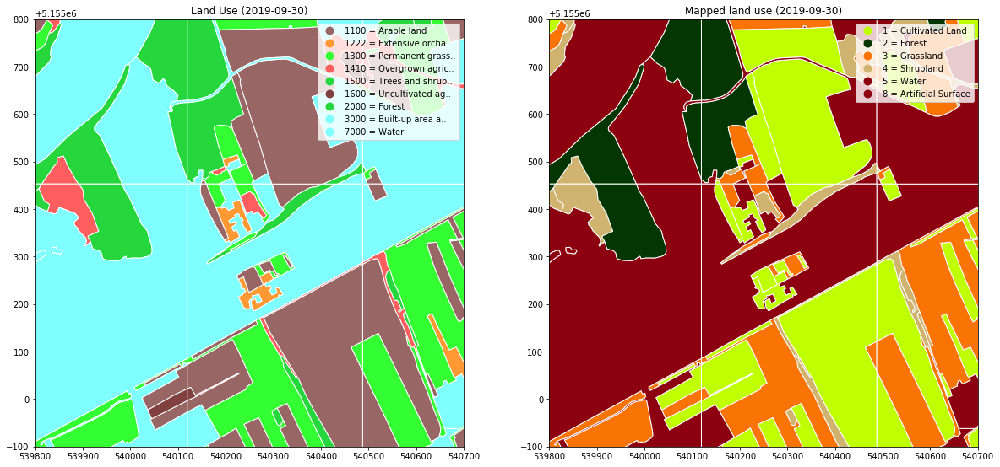

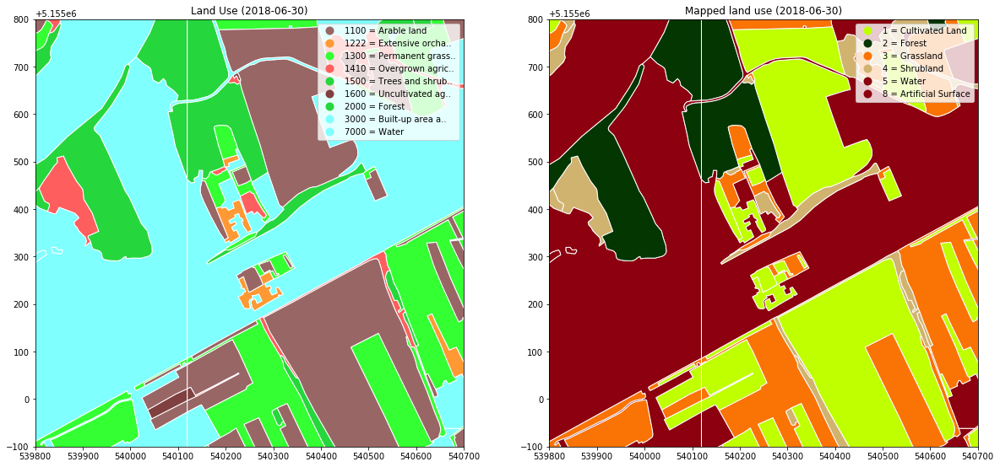

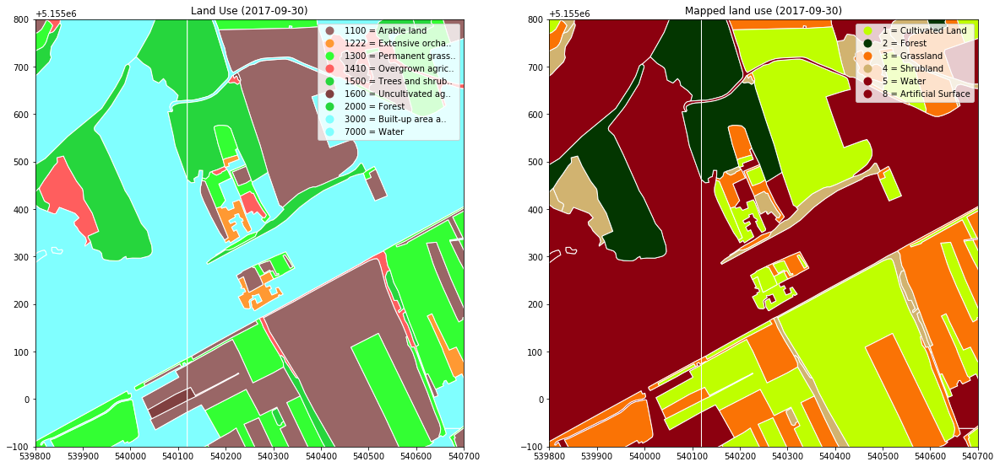

In [13]:
selected_timeseries_times = [distinct_d_update[0], distinct_d_update[5], distinct_d_update[8]]
selected_timeseries_center = (15.5250405633, 46.5505120371) # longitude, latitude
selected_timeseries_size = 900 # meters

def displayPlot(title, ax, data, dataColumn, bbox, colorMapping, legendMapping):
    ax.set_xlim([bbox.min_x, bbox.max_x])
    ax.set_ylim([bbox.min_y, bbox.max_y])

    # since geopandas does its own normalization, we need to find used values,
    # to properly map the colors and legend texts to the actual values
    uniqueVals = data[dataColumn].unique()
    uniqueVals.sort()
    cmap = colors.ListedColormap([colorMapping[val] for val in uniqueVals])
    norm = colors.BoundaryNorm(range(cmap.N), cmap.N)
    
    data.plot(ax=ax, column=dataColumn, edgecolor='w', alpha=1, categorical=True, legend=True, cmap=cmap, norm=norm)
    ax.set_title(title);
    for text, label in zip(ax.get_legend().get_texts(), [legendMapping[val] for val in uniqueVals]):
        text.set_text(label)

with psycopg2.connect(**db_conn_params) as db_conn: # must use single DB connection for all the tasks
    from_wgs84_transformer = pyproj.Transformer.from_crs(str(CRS.WGS84), str(country_crs), always_xy=True)
    x, y = from_wgs84_transformer.transform(selected_timeseries_center[0], selected_timeseries_center[1])
    size = selected_timeseries_size
    bbox = (x - size * 0.5, y - size * 0.5, x + size * 0.5, y + size * 0.5)
    bbox = BBox(bbox=list(bbox), crs=country_crs)
    
    for d_update in selected_timeseries_times:
        # Plot time series of land use for selected bbox
        land_use = loadFromDatabaseWithLulcMapping(db_conn, "Land use", db_land_use_table, db_land_use_class_column, 
            None, bbox, bbox.get_crs(), d_update, d_update)
        
        fig, axes = plt.subplots(1, 2, figsize=(20, 20))
        
        displayPlot('Land Use ({})'.format(d_update), axes[0], land_use, 'land_use', bbox, landUseColorMapping, landUseLegendTexts)
        displayPlot('Mapped land use ({})'.format(d_update), axes[1], land_use, 'lulcid', bbox, lulcColorMapping, lulcLegendTexts)

#### Satellite imagery for selected AOI

##### Configure xcube

In [14]:
## Plot time series of satellite images for bbox
spatial_res_meters = 10
pixx = (total_bbox[2] - total_bbox[0]) / spatial_res_meters; pixy = (total_bbox[3] - total_bbox[1]) / spatial_res_meters;
spatial_res = float(np.mean([(total_bbox_wgs84[2] - total_bbox_wgs84[0]) / pixx, (total_bbox_wgs84[3] - total_bbox_wgs84[1]) / pixy]))

cube_config = CubeConfig(dataset_name='S2L1C',
                         band_names=["B02", "B03", "B04", "B08", "B11", "B12"],
                         chunk_size=[512, 512],
                         geometry=total_bbox_wgs84,
                         spatial_res=spatial_res,
                         time_range=['2019-02-01', '2019-09-30'],
                         time_period='4D')  

# So we can print some SentinelHub usage stats
request_collector = Observers.request_collector()
cube = open_cube(cube_config, request_collector, client_id=sentinelhub_client_id, client_secret=sentinelhub_client_secret)

# Add Indecies
## NDVI
b_red = cube.B04
b_nir = cube.B08
ndvi = (b_nir - b_red) / (b_nir + b_red)
ndvi.attrs['long_name'] = 'Normalized Difference Vegetation Index'
ndvi.attrs['units'] = 'unitless'
cube["ndvi"] = ndvi

## NDWI
b_green = cube.B03
b_nir = cube.B08
ndwi = (b_green - b_nir) / (b_green + b_nir)
ndwi.attrs['long_name'] = 'Normalized Difference Water Index'
ndwi.attrs['units'] = 'unitless'
cube["ndwi"] = ndwi

# cube.time

/opt/conda/lib/python3.7/site-packages/xcube_sh/config.py:84: UserWarning: the chunk_size parameter is no longer supported, use tile_size instead
  warnings.warn('the chunk_size parameter is no longer supported, use tile_size instead')
/opt/conda/lib/python3.7/site-packages/xcube_sh/store.py:73: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  t_array = np.array([s + 0.5 * (e - s) for s, e in self._time_ranges]).astype('datetime64[s]').astype(np.int64)
/opt/conda/lib/python3.7/site-packages/xcube_sh/store.py:74: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  t_bnds_array = np.array(self._time_ranges).astype('datetime64[s]').astype(np.int64)


##### Plot True Color image from selected date

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


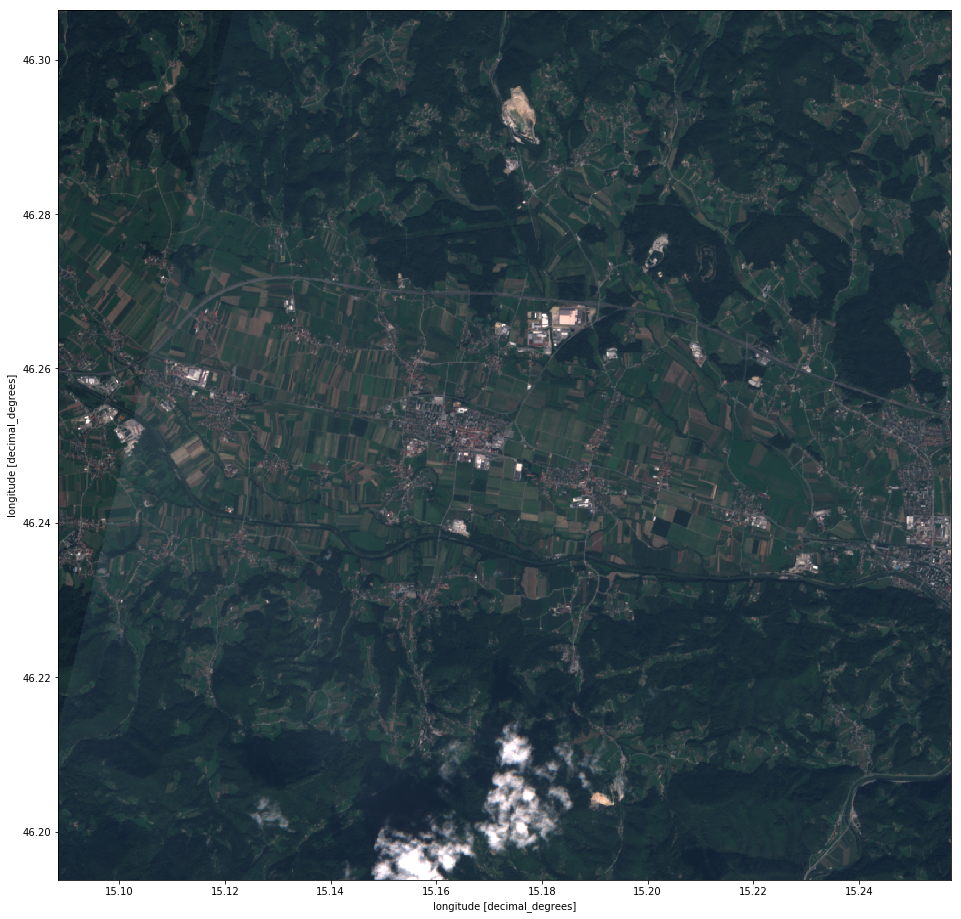

In [15]:
# True color image
factor = 2.5
R = cube.B04.sel(time=selected_patch_displayed_time)*factor
G = cube.B03.sel(time=selected_patch_displayed_time)*factor
B = cube.B02.sel(time=selected_patch_displayed_time)*factor
RGB = np.dstack([R, G, B])
rgb_array = xr.DataArray(RGB, dims=('lat', 'lon', 'b'), coords=dict(lat=cube.B04.lat, lon=cube.B04.lon))
img = rgb_array.plot.imshow(rgb='b', figsize=(16, 16))

##### Plot time series of satellite images for selected band

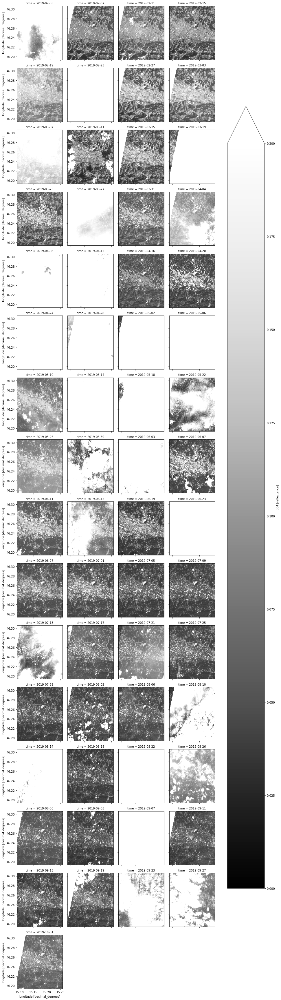

In [16]:
# Plot time series of band B04
img = cube.B04.plot.imshow(col='time', col_wrap=4, vmin=0, vmax=0.2, cmap='Greys_r')

##### Plot time series of NDVI

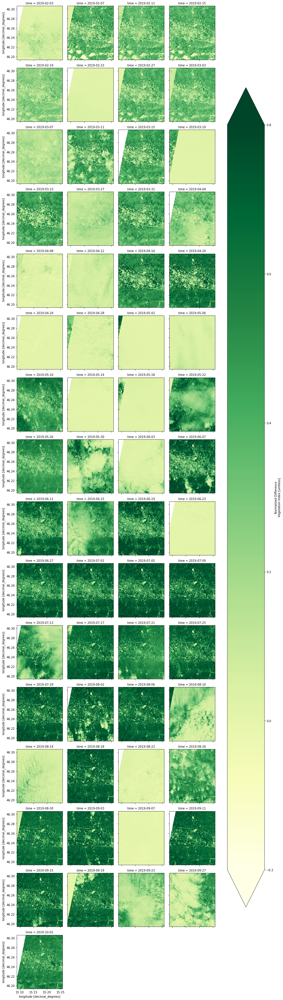

In [17]:
# Plot time series of NDVI
img = cube.ndvi.plot.imshow(col='time', col_wrap=4, vmin=-0.2, vmax=0.8, cmap='YlGn')

##### Plot all bands and data in xcube for given date

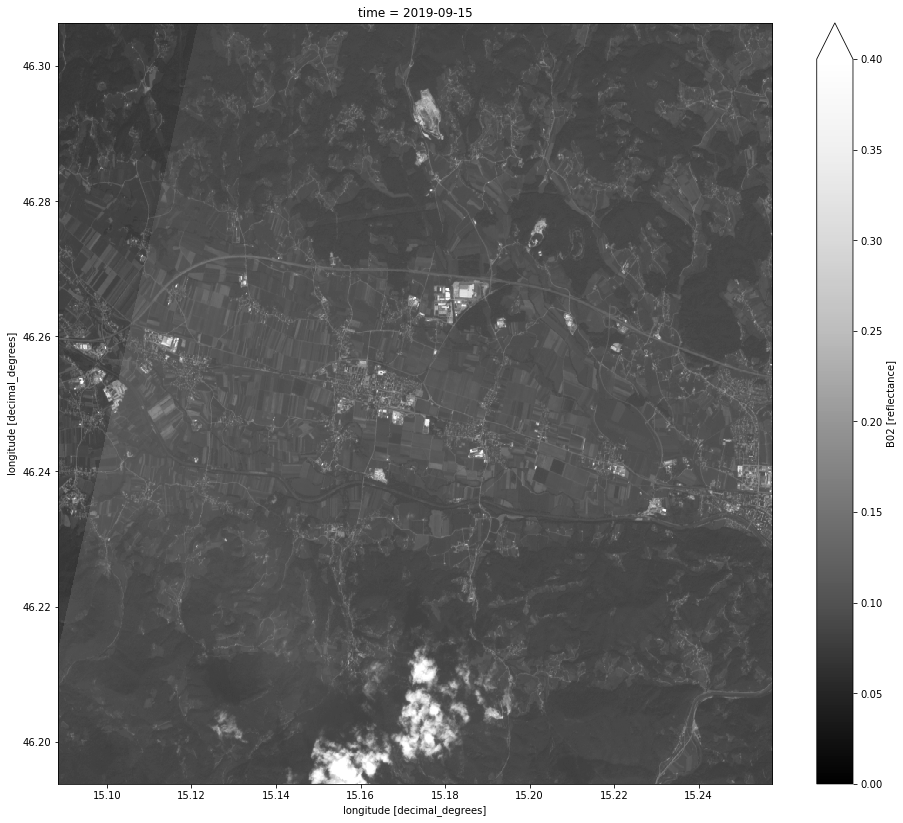

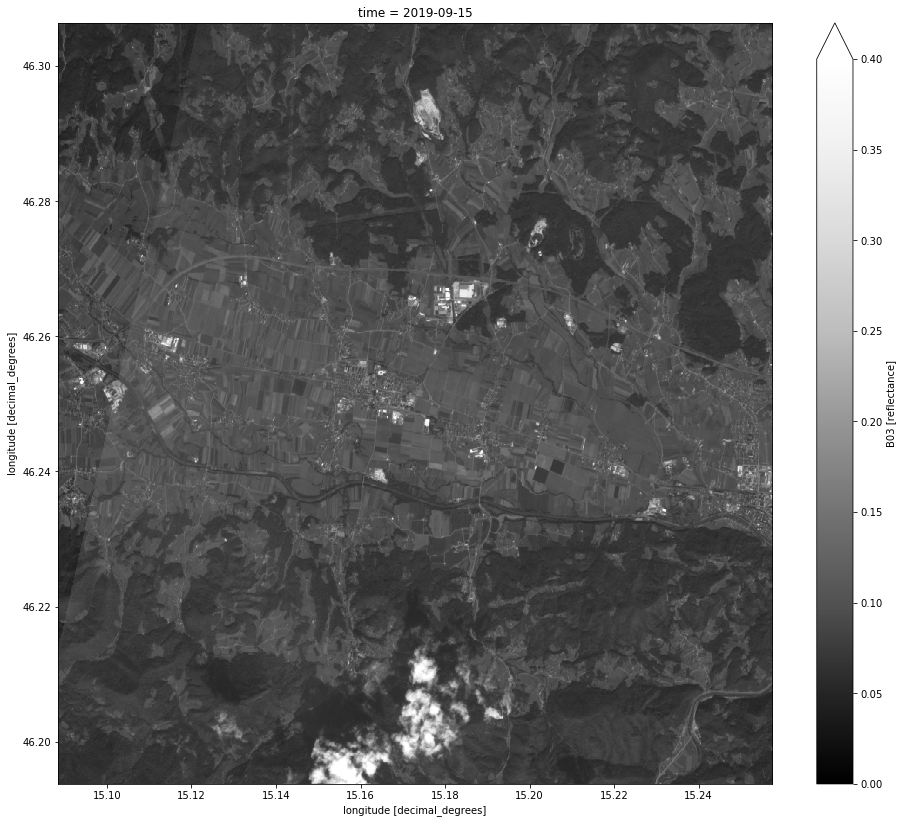

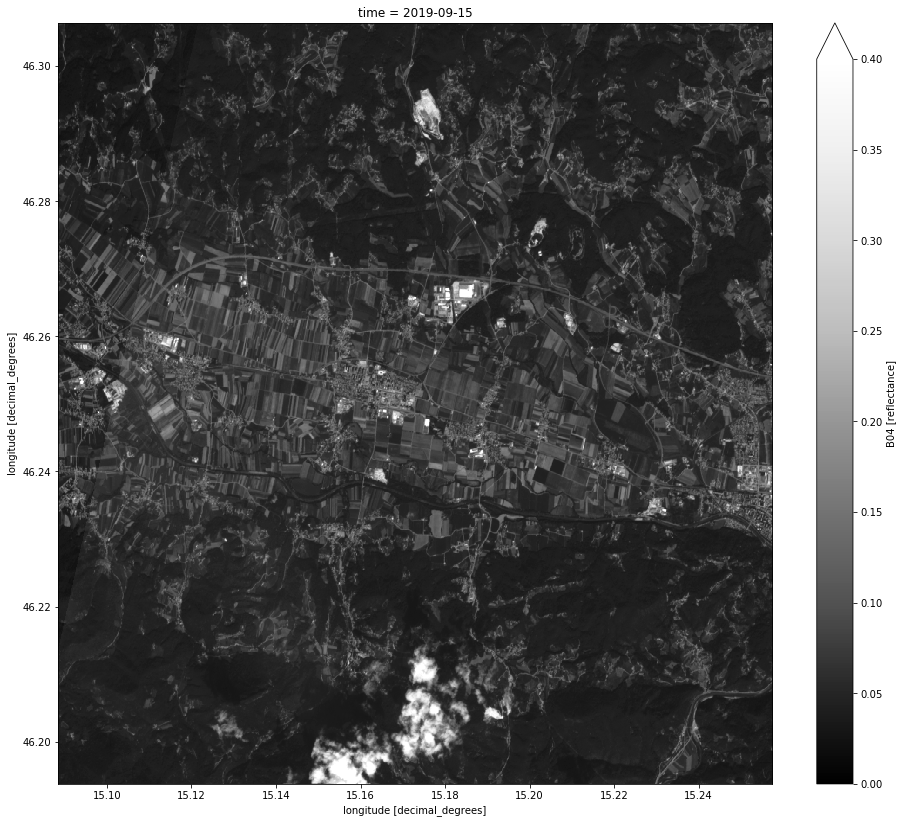

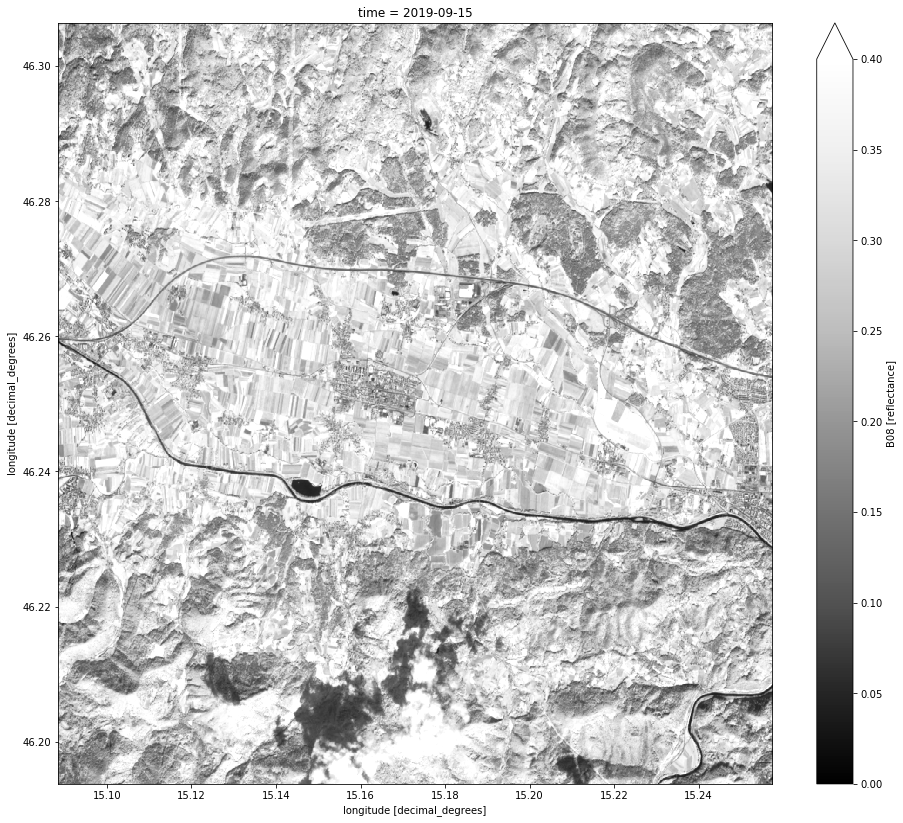

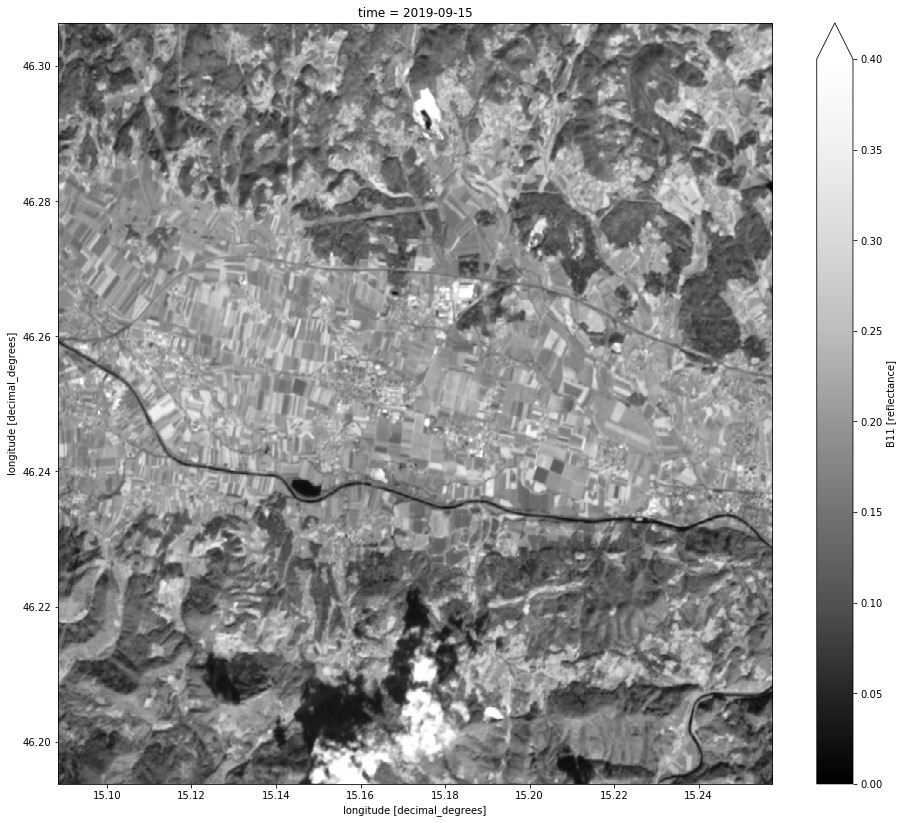

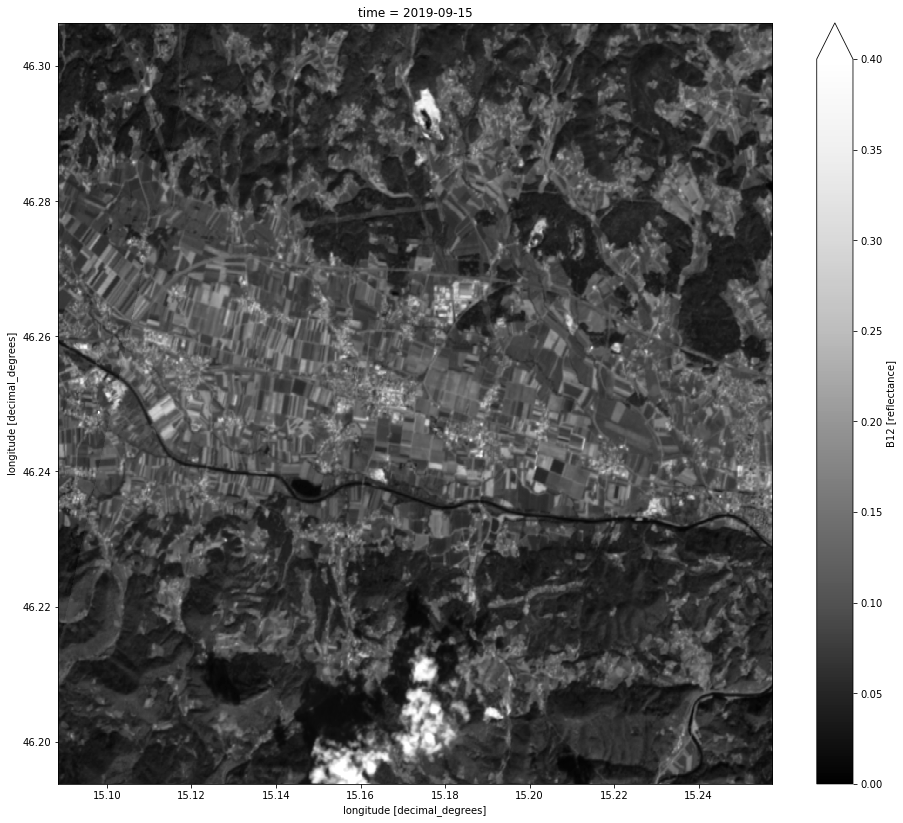

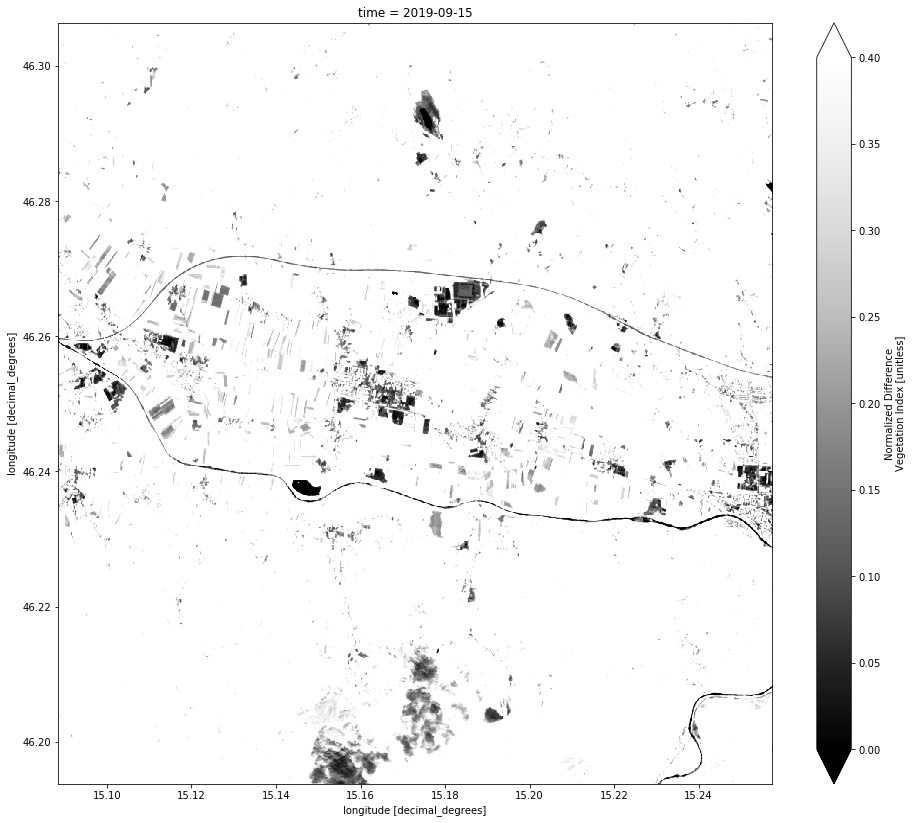

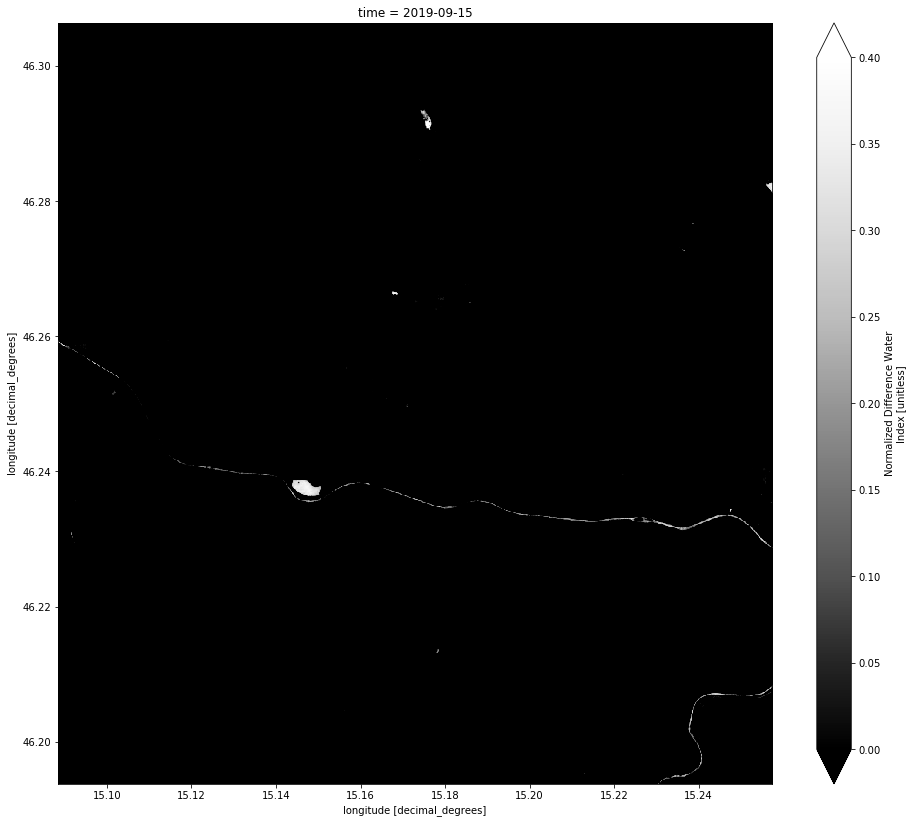

In [18]:
# Plot all bands and data in xcube for given date
for band in cube.data_vars:
    cube[band].sel(time=selected_patch_displayed_time).plot.imshow(vmin=0, vmax=0.4, cmap='Greys_r', figsize=(16, 14))

##### Zoom closer to user defined area (mask xcube)

In [19]:
# Mask original cube with smaller bbox
zoomed_center = (15.1645, 46.2495) # (13.860377, 46.283196) # longitude, latitude
zoomed_size = 0.25 # ratio to the original 3x3 patches cube

zoomed_size_degrees = zoomed_size
selected_bbox = (
    zoomed_center[0] - zoomed_size * 0.5 * (total_bbox_wgs84[2] - total_bbox_wgs84[0]), 
    zoomed_center[1] - zoomed_size * 0.5 * (total_bbox_wgs84[3] - total_bbox_wgs84[1]),
    zoomed_center[0] + zoomed_size * 0.5 * (total_bbox_wgs84[2] - total_bbox_wgs84[0]), 
    zoomed_center[1] + zoomed_size * 0.5 * (total_bbox_wgs84[3] - total_bbox_wgs84[1])
)
small_cube = xcube.core.geom.mask_dataset_by_geometry(cube, selected_bbox, no_clip=False, save_geometry_wkt=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


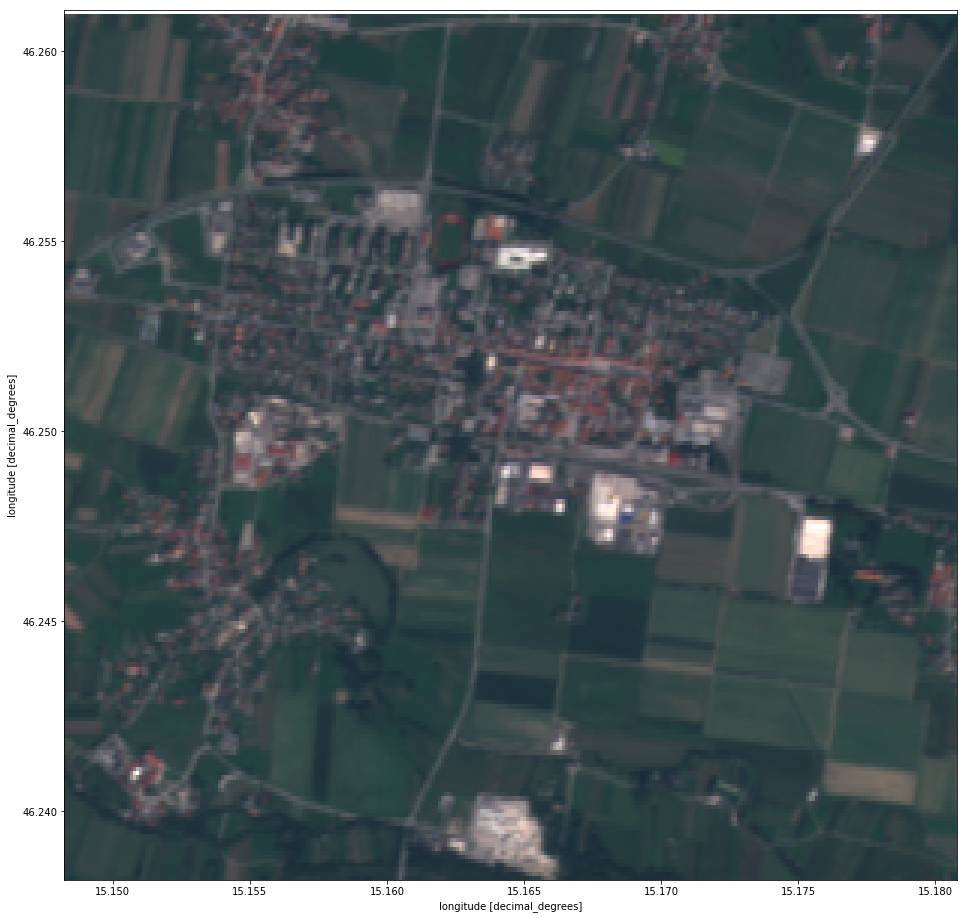

In [20]:
# True color
factor = 2.5
R = small_cube.B04.sel(time=selected_patch_displayed_time)*factor
G = small_cube.B03.sel(time=selected_patch_displayed_time)*factor
B = small_cube.B02.sel(time=selected_patch_displayed_time)*factor
RGB = np.dstack([R, G, B])
rgb_array = xr.DataArray(RGB, dims=('lat', 'lon', 'b'), coords=dict(lat=small_cube.B04.lat, lon=small_cube.B04.lon))
img = rgb_array.plot.imshow(rgb='b', figsize=(16, 16))

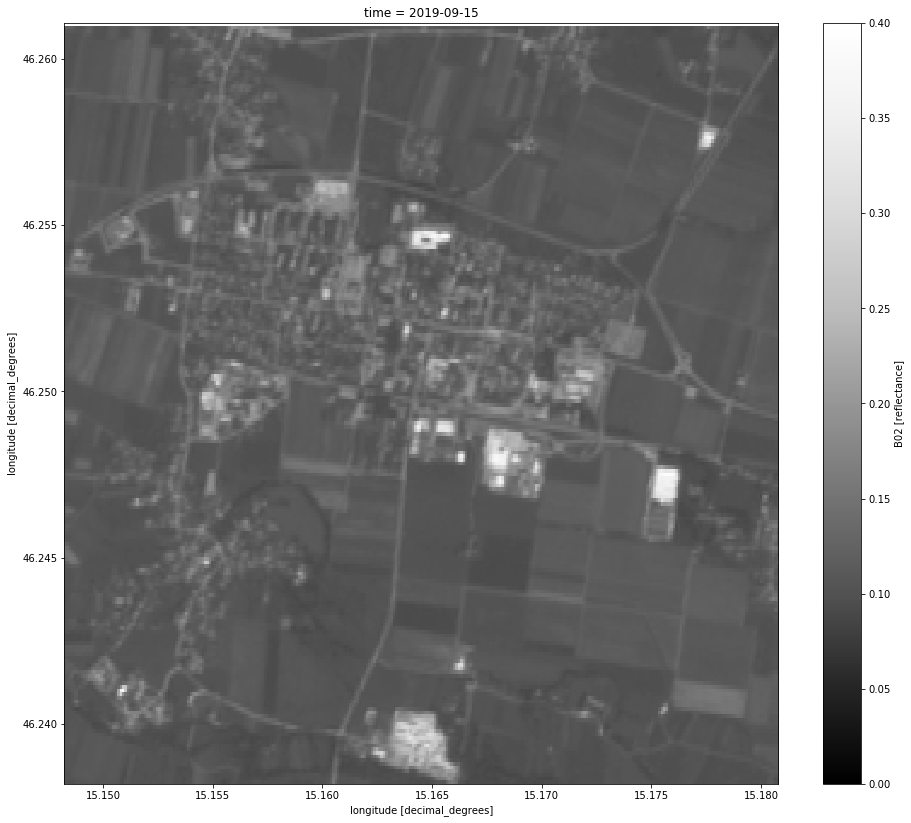

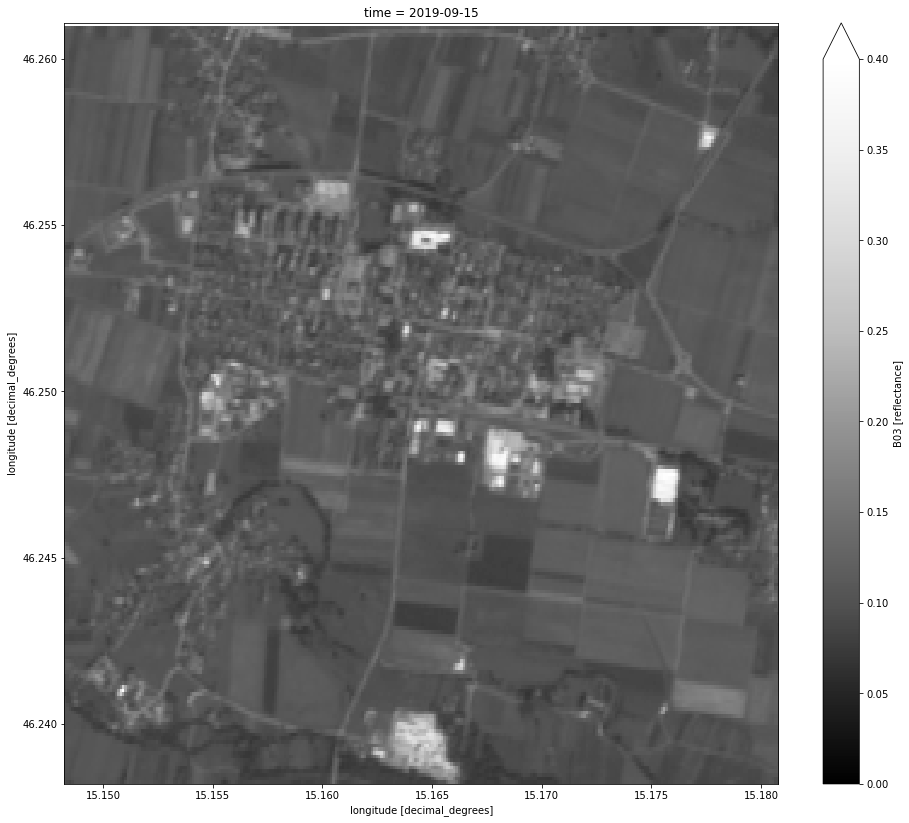

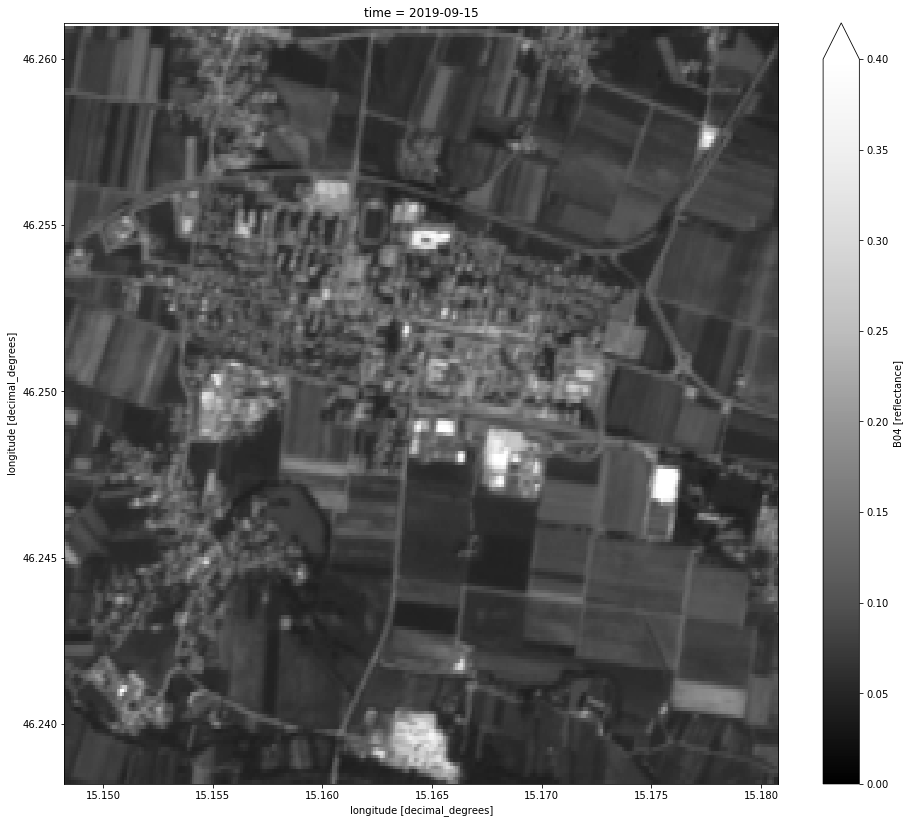

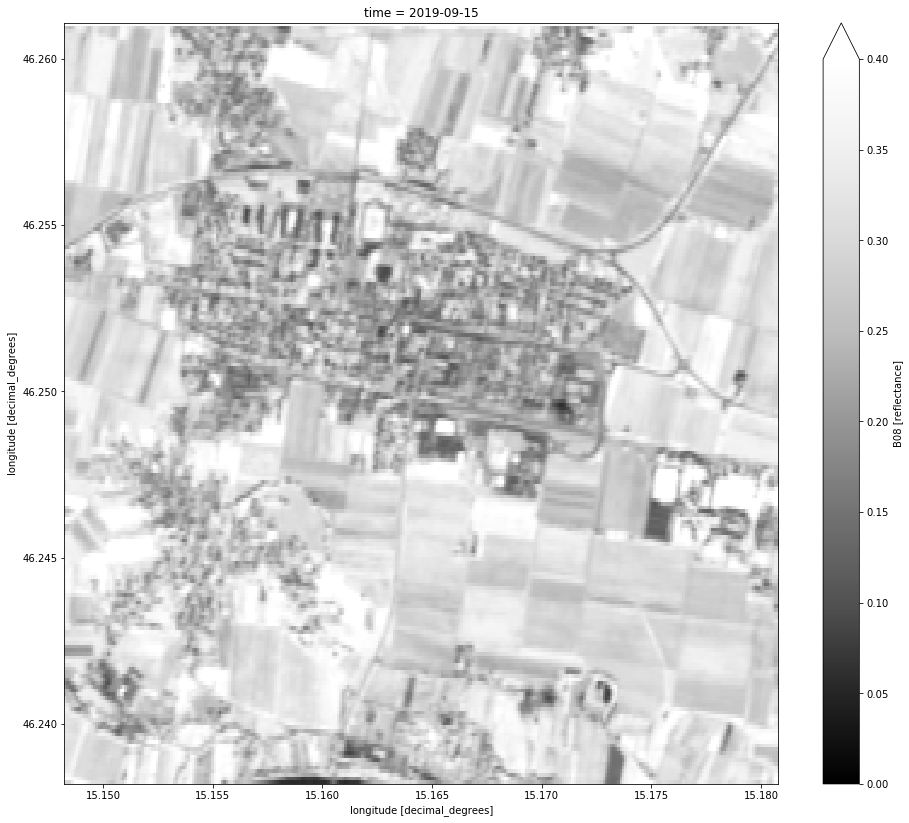

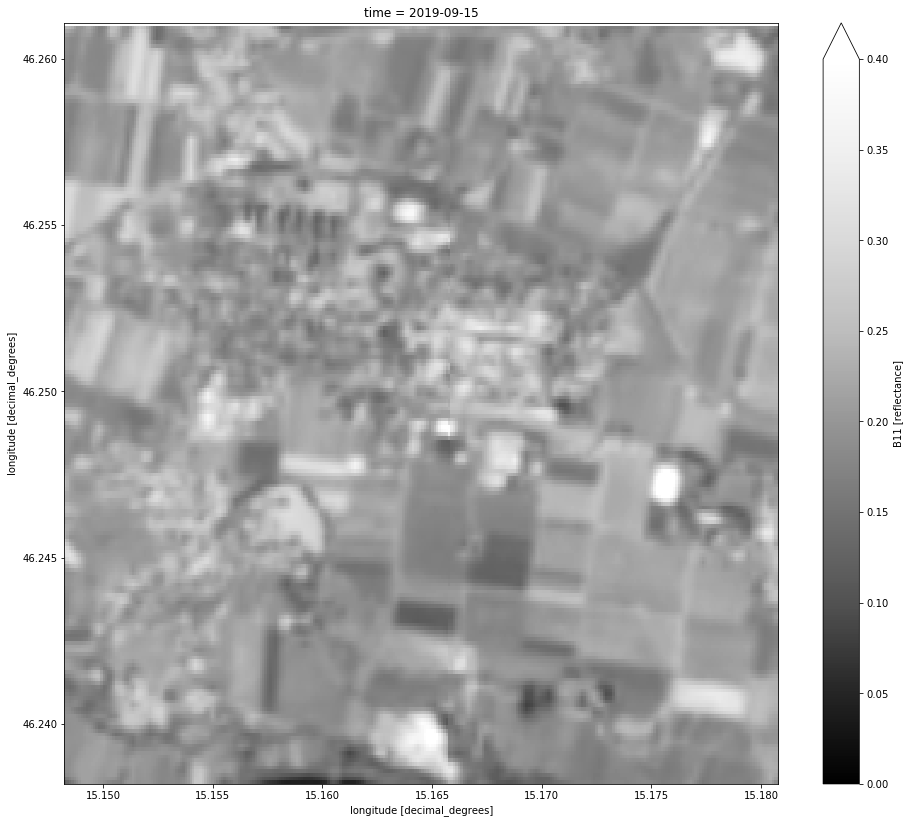

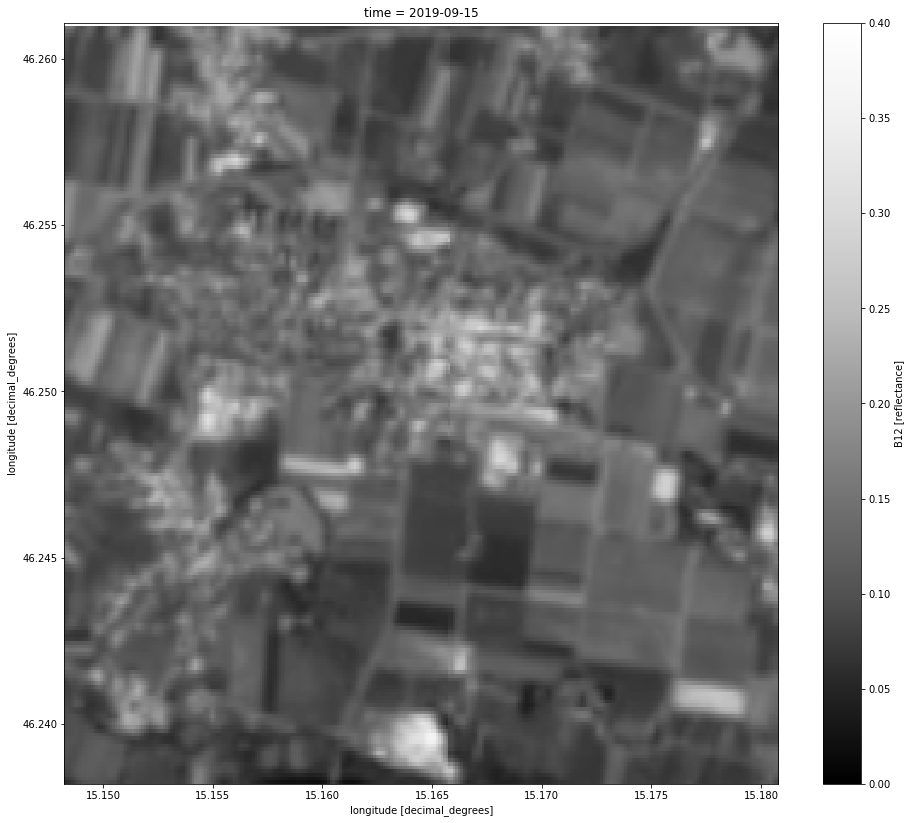

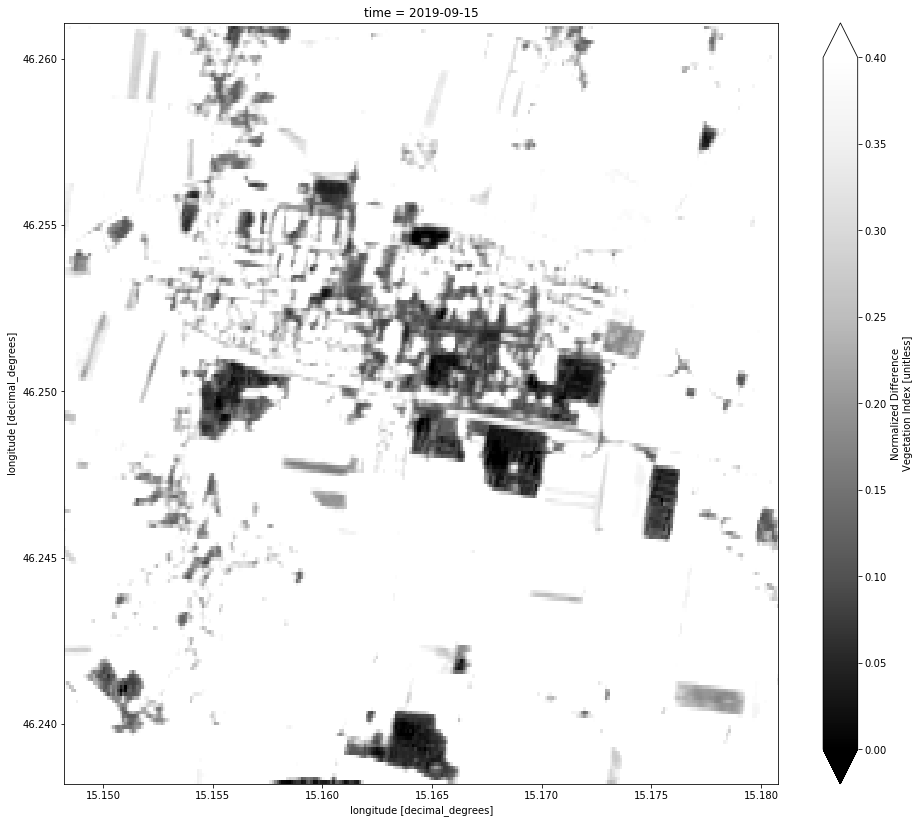

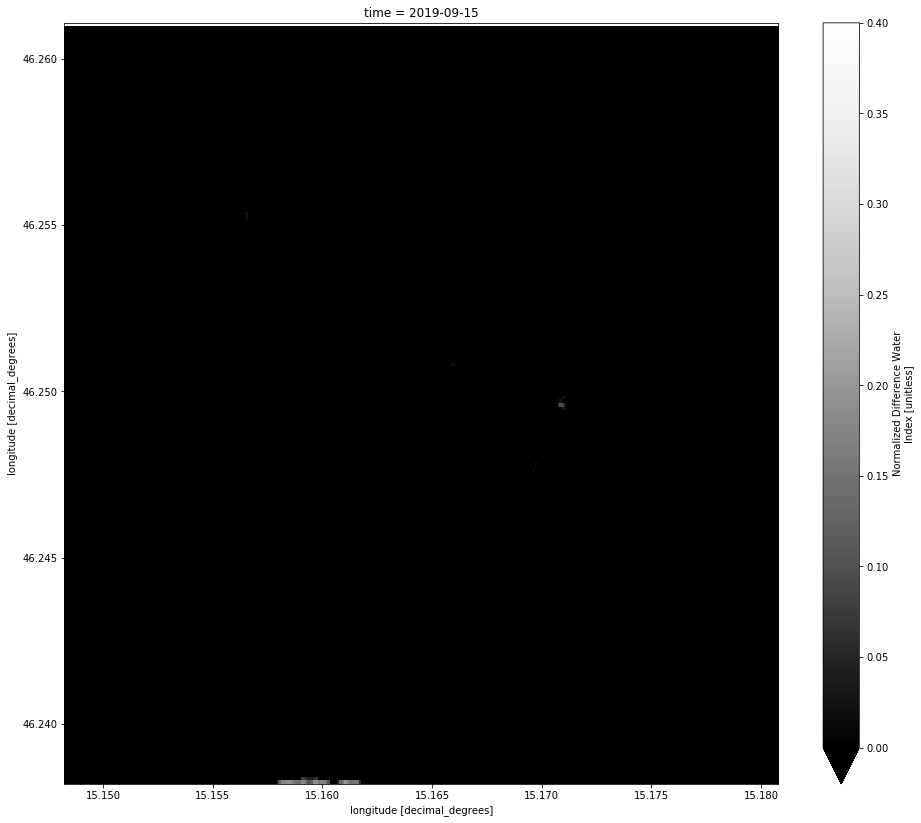

In [21]:
# Plot all bands for selected time
for band in small_cube.data_vars:
    small_cube[band].sel(time=selected_patch_displayed_time).plot.imshow(vmin=0, vmax=0.4, cmap='Greys_r', figsize=(16, 14))

## Part 2: LULC prediction with Machine Learning

### Set some of the inputs for prediction with ML

In [22]:
selected_db_land_use_date = '2019-09-30'
selected_date_interval_for_satellite_imagery = ['2019-09-01', '2019-09-19']
selected_max_cc = 0.8

### Fill EOPatches with data:

Now it's time to create EOPatches and fill them with Sentinel-2 data using Sentinel Hub services. We will add the following data to each EOPatch:

* L1C custom list of bands [B02, B03, B04, B08, B11, B12], which corresponds to [B, G, R, NIR, SWIR1, SWIR2] wavelengths.

* SentinelHub's cloud probability map and cloud mask

Additionally, we will add:

* Calculated NDVI, NDWI, euclidean NORM information

* A mask of validity, based on acquired data from Sentinel and cloud coverage. Valid pixel is if:
   
    1. IS_DATA == True
    2. CLOUD_MASK == 0 (1 indicates that pixel was identified to be covered with cloud)

An EOPatch is created and manipulated using EOTasks, which are chained in an EOWorkflow. In this example the final workflow is executed on all patches, which are saved to the specified directory.

#### Define some needed custom EOTasks

In [23]:
class SentinelHubValidData:
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    """
    def __call__(self, eopatch):        
        return np.logical_and(eopatch.mask['IS_DATA'].astype(np.bool), 
                              np.logical_not(eopatch.mask['CLM'].astype(np.bool)))
    
class CountValid(EOTask):   
    """
    The task counts number of valid observations in time-series and stores the results in the timeless mask.
    """
    def __init__(self, count_what, feature_name):
        self.what = count_what
        self.name = feature_name
        
    def execute(self, eopatch):
        eopatch.add_feature(FeatureType.MASK_TIMELESS, self.name, np.count_nonzero(eopatch.mask[self.what],axis=0))
        
        return eopatch


class NormalizedDifferenceIndex(EOTask):   
    """
    The tasks calculates user defined Normalised Difference Index (NDI) between two bands A and B as:
    NDI = (A-B)/(A+B).
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        
        ndi = (band_a - band_b) / (band_a  + band_b)
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndi[..., np.newaxis])
        
        return eopatch

    
class EuclideanNorm(EOTask):   
    """
    The tasks calculates Euclidian Norm of all bands within an array:
    norm = sqrt(sum_i Bi**2),
    where Bi are the individual bands within user-specified feature array.
    """
    def __init__(self, feature_name, in_feature_name):
        self.feature_name = feature_name
        self.in_feature_name = in_feature_name
    
    def execute(self, eopatch):
        arr = eopatch.data[self.in_feature_name]
        norm = np.sqrt(np.sum(arr**2, axis=-1))
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, norm[..., np.newaxis])
        return eopatch

#### Define the workflow tasks

In [24]:
# TASK FOR BAND DATA
# add a request for B(B02), G(B03), R(B04), NIR (B08), SWIR1(B11), SWIR2(B12) 
# from default layer 'ALL_BANDS' at 10m resolution
# Here we also do a simple filter of cloudy scenes. A detailed cloud cover 
# detection is performed in the next step
INSTANCE_ID = "35e5eb0c-3b6a-40d9-8dca-31121465a55d"
custom_script = 'return [B02, B03, B04, B08, B11, B12];'
add_data = S2L1CWCSInput(
    layer='BANDS-S2-L1C', 
    feature=(FeatureType.DATA, 'BANDS'), # save under name 'BANDS'
    custom_url_params={CustomUrlParam.EVALSCRIPT: custom_script}, # custom url for 6 specific bands
    resx='10m', # resolution x
    resy='10m', # resolution y
    maxcc=selected_max_cc, # maximum allowed cloud cover of original ESA tiles
    instance_id=INSTANCE_ID
)

# TASK FOR CLOUD INFO
# cloud detection is performed at 80m resolution 
# and the resulting cloud probability map and mask 
# are scaled to EOPatch's resolution
cloud_classifier = get_s2_pixel_cloud_detector(average_over=2, dilation_size=1, all_bands=False)
add_clm = AddCloudMaskTask(cloud_classifier, 'BANDS-S2CLOUDLESS', cm_size_y='80m', cm_size_x='80m', 
                           cmask_feature='CLM', # cloud mask name
                           cprobs_feature='CLP' # cloud prob. map name
                          )

# TASKS FOR CALCULATING NEW FEATURES
# NDVI: (B08 - B04)/(B08 + B04)
# NDWI: (B03 - B08)/(B03 + B08)
# NORM: sqrt(B02^2 + B03^2 + B04^2 + B08^2 + B11^2 + B12^2)
ndvi = NormalizedDifferenceIndex('NDVI', 'BANDS/3', 'BANDS/2')
ndwi = NormalizedDifferenceIndex('NDWI', 'BANDS/1', 'BANDS/3')
norm = EuclideanNorm('NORM','BANDS')

# TASK FOR VALID MASK
# validate pixels using SentinelHub's cloud detection mask and region of acquisition 
add_sh_valmask = AddValidDataMaskTask(SentinelHubValidData(), 
                                      'IS_VALID' # name of output mask
                                     )

# TASK FOR COUNTING VALID PIXELS
# count number of valid observations per pixel using valid data mask 
count_val_sh = CountValid('IS_VALID', # name of existing mask
                          'VALID_COUNT' # name of output scalar
                         )

# TASK FOR SAVING TO OUTPUT (if needed)
path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'
if not os.path.isdir(path_out):
    os.makedirs(path_out)
save = SaveTask(path_out, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

#### Reference map task

For this example, a subset of the country-wide reference for land-use-land-cover is provided. It is available in the form of a shapefile, which contains polygons and their corresponding labels. The labels represent the 10 classes from the lulcMapping.

The main point of this task is to create a raster mask from the vector polygons and add it to the eopatch. With this procedure, any kind of a labeled shapefile can be transformed into a raster reference map. This result is achieved with the existing task `VectorToRaster` from the `eolearn.geometry` package. All polygons belonging to the each of the classes are separately burned to the raster mask.

In [25]:
class LoadFromDatabaseTask(EOTask):
    def __init__(self, feature, taskName, crs, tableName, landUseColumneName, 
        dateFilterMin, dateFilterMax, mappedColumnName = None, mappingLambdaFunc = None):
        
        self.feature_type, self.feature_name = next(self._parse_features(feature)())
        self.taskName = taskName
        self.crs = crs
        self.tableName = tableName
        self.landUseColumneName = landUseColumneName
        self.dateFilterMin = dateFilterMin
        self.dateFilterMax = dateFilterMax
        self.mappedColumnName = mappedColumnName
        self.mappingLambdaFunc = mappingLambdaFunc

    def execute(self, eopatch, db_conn):
        eopatch[self.feature_type][self.feature_name] = loadFromDatabase(db_conn, 
            self.taskName, self.tableName, self.landUseColumneName, None, eopatch.bbox, eopatch.bbox.get_crs(),
            self.dateFilterMin, self.dateFilterMax, None, True,
            self.mappedColumnName, self.mappingLambdaFunc)
        return eopatch
    

# LPIS
load_lpis_db_task = LoadFromDatabaseTask((FeatureType.VECTOR_TIMELESS, 'LPIS_GDF'), 
    "LPIS", country_crs, db_lpis_table, db_lpis_class_column, selected_db_land_use_date, selected_db_land_use_date)

lpis_rasterization_task = VectorToRaster((FeatureType.VECTOR_TIMELESS, 'LPIS_GDF'), (FeatureType.MASK_TIMELESS, 'LPIS'),
    values_column='land_use', raster_shape=None, raster_resolution = 10,
    raster_dtype=np.uint16)

lpis_export_tiff = ExportToTiff((FeatureType.MASK_TIMELESS, 'LPIS'))


# Land use
load_land_use_db_task = LoadFromDatabaseTask((FeatureType.VECTOR_TIMELESS, 'LAND_USE_GDF'), 
    "Land use", country_crs, db_land_use_table, db_land_use_class_column, selected_db_land_use_date, selected_db_land_use_date, 
    "lulcid", lambda lulc: landUseToLulcMapping[lulc] if lulc in landUseToLulcMapping else 0)

land_use_rasterization_task = VectorToRaster((FeatureType.VECTOR_TIMELESS, 'LAND_USE_GDF'), (FeatureType.MASK_TIMELESS, 'LAND_USE'),
    values_column='land_use', raster_shape=None, raster_resolution = 10,
    raster_dtype=np.uint16)

land_use_export_tiff = ExportToTiff((FeatureType.MASK_TIMELESS, 'LAND_USE'))


# LULC, uses the previously loaded LAND_USE_GDF
lulc_rasterization_task = VectorToRaster((FeatureType.VECTOR_TIMELESS, 'LAND_USE_GDF'), (FeatureType.MASK_TIMELESS, 'LULC'),
    values_column='lulcid', raster_shape=(FeatureType.MASK, 'IS_VALID'),
    raster_dtype=np.uint8)


#### Define the workflow

All the tasks that were defined so far create and fill the EOPatches. The tasks need to be put in some order and executed one by one. This can be achieved by manually executing the tasks, or more conveniently, defining an `EOWorkflow` which does this for you.

The following workflow is created and executed:

1. Create EOPatches with band data
2. Add cloud info
3. Calculate and add NDVI, NDWI, NORM
4. Add mask of valid pixels
5. Add scalar feature representing the cound of valid pixels
7. Save eopatches

An EOWorkflow can be linear or more complex, but it should be acyclic. Here we will use the linear case of the EOWorkflow, available as `LinearWorkflow`

Define the workflow

In [26]:
# Define the workflow
workflow = LinearWorkflow(
    add_data,
    add_clm,
    ndvi,
    ndwi,
    norm,
    add_sh_valmask,
    count_val_sh,
    load_lpis_db_task,
    lpis_rasterization_task,
    lpis_export_tiff,
    load_land_use_db_task,
    land_use_rasterization_task,
    land_use_export_tiff,
    lulc_rasterization_task,
    save
)

# Let's visualize it
workflow.dependency_graph()

ExecutableNotFound: failed to execute ['dot', '-Tsvg'], make sure the Graphviz executables are on your systems' PATH

_This may take some time, so go grab a cup of coffee ..._

In [ ]:
%%time

# Execute the workflow

source_tiff_location = './source_tiff'
if not os.path.isdir(source_tiff_location):
    os.makedirs(source_tiff_location)

# define additional parameters of the workflow
with psycopg2.connect(**db_conn_params) as db_conn: # must use single DB connection for all the tasks
    execution_args = []
    for idx, bbox in enumerate(bbox_list[patchIDs]):
        execution_args.append({
            add_data: {'bbox': bbox, 'time_interval': selected_date_interval_for_satellite_imagery},
            load_land_use_db_task: {'db_conn': db_conn},
            load_lpis_db_task: {'db_conn': db_conn},
            lpis_export_tiff: {'filename': '{}/lpis_eopatch_{}_original.tiff'.format(source_tiff_location, idx)},
            land_use_export_tiff: {'filename': '{}/land_use_eopatch_{}_original.tiff'.format(source_tiff_location, idx)},
            save: {'eopatch_folder': 'eopatch_{}'.format(idx)}
        })

executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=5, multiprocess=True)

executor.make_report()

In this case, all patches come from a small region, so all of them have the same dates of acquisition for at least a few dates, so we can inspect the area without interpolation at this point.

### Visualize the true color image

In [ ]:
selected_timestamp = datetime.datetime.strptime('2019-05-01', "%Y-%m-%d") # or None

# Draw the RGB image
path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'
fig = plt.figure(figsize=(20, 20 * aspect_ratio))

pbar = tqdm(total=9)
for i in range(9):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    timeIndex = next(i for i, time in enumerate(eopatch.timestamp) if time.date() == selected_timestamp.date()) if not selected_timestamp is None else None
    if timeIndex is None:
        timeIndex = 0
        
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(np.clip(eopatch.data['BANDS'][timeIndex][..., [2, 1, 0]] * 3.5, 0, 1))
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

### Visualize the reference map

In [ ]:
path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

cmapValues = [color for id, color in lulcColorMapping.items()]
normValues = list(lulcColorMapping.keys())
normValues.append(20)
cmap = colors.ListedColormap(cmapValues)
norm = colors.BoundaryNorm(normValues, cmap.N + 1)
    
pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['LULC'].squeeze(), cmap=cmap, norm=norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([id for id in lulcMapping.keys()])
cb.ax.set_xticklabels([entry["name"] for entry in lulcMapping.values()], rotation=45, fontsize=15)
plt.show()

### Prepare the training data

We will create a new workflow that processes the data:

1. Remove too cloudy scenes
   * Check the ratio of the valid data for each patch and for each time frame
   * Keep only time frames with > 80 % valid coverage (no clouds)
2. Concatenate BAND, NDVI, NDWI, NORM info into a single feature called FEATURES
3. Perform temporal interpolation (filling gaps and resampling to the same dates)
   * Create a task for linear interpolation in the temporal dimension
   * Provide the cloud mask to tell the interpolating function which values to update
4. Perform erosion
   * This removes artefacts with a width of 1 px, and also removes the edges between polygons of different classes
5. Random spatial sampling of the EOPatches
   * Randomly take a subset of pixels from a patch to use in the machine learning training
6. Split patches for training/validation
   * Split the patches into a training and validation set

#### Define EOTasks

In [ ]:
class ConcatenateData(EOTask):
    """ Task to concatenate data arrays along the last dimension
    """
    def __init__(self, feature_name, feature_names_to_concatenate):
        self.feature_name = feature_name
        self.feature_names_to_concatenate = feature_names_to_concatenate

    def execute(self, eopatch):
        arrays = [eopatch.data[name] for name in self.feature_names_to_concatenate]

        eopatch.add_feature(FeatureType.DATA, self.feature_name, np.concatenate(arrays, axis=-1))

        return eopatch
    
    
class ValidDataFractionPredicate:
    """ Predicate that defines if a frame from EOPatch's time-series is valid or not. Frame is valid, if the 
    valid data fraction is above the specified threshold.
    """
    def __init__(self, threshold):
        self.threshold = threshold
        
    def __call__(self, array):
        coverage = np.sum(array.astype(np.uint8)) / np.prod(array.shape)
        return coverage > self.threshold
    
# TASK TO LOAD EXISTING EOPATCHES
load = LoadFromDisk(path_out)

# TASK FOR CONCATENATION
concatenate = ConcatenateData('FEATURES', ['BANDS', 'NDVI', 'NDWI', 'NORM'])

# TASK FOR FILTERING OUT TOO CLOUDY SCENES
# keep frames with > 80 % valid coverage
valid_data_predicate = ValidDataFractionPredicate(0.8)
filter_task = SimpleFilterTask((FeatureType.MASK, 'IS_VALID'), valid_data_predicate)

# TASK FOR LINEAR INTERPOLATION
# linear interpolation of full time-series and date resampling
rangeParams = selected_date_interval_for_satellite_imagery.copy()
rangeParams.append(16) # step of 16 days between key values
resampled_range = tuple(rangeParams)
linear_interp = LinearInterpolation(
    'FEATURES', # name of field to interpolate
    mask_feature=(FeatureType.MASK, 'IS_VALID'), # mask to be used in interpolation
    copy_features=[(FeatureType.MASK_TIMELESS, 'LULC')], # features to keep
    resample_range=resampled_range, # set the resampling range
    bounds_error=False # extrapolate with NaN's
)

# TASK FOR EROSION
# erode each class of the reference map
erosion = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'LULC','LULC_ERODED'), disk_radius=1)

# TASK FOR SPATIAL SAMPLING
# Uniformly sample about pixels from patches
n_samples = int(4e4) if use_smaller_patches else int(1e5) # no. of pixels to sample
ref_labels = list(range(11)) # reference labels to take into account when sampling
spatial_sampling = PointSamplingTask(
    n_samples=n_samples, 
    ref_mask_feature='LULC_ERODED', 
    ref_labels=ref_labels, 
    sample_features=[  # tag fields to sample
        (FeatureType.DATA, 'FEATURES'),
        (FeatureType.MASK_TIMELESS, 'LULC_ERODED')
    ])

path_out_sampled = './eopatches_sampled_small/' if use_smaller_patches else './eopatches_sampled_large/'
if not os.path.isdir(path_out_sampled):
    os.makedirs(path_out_sampled)
save = SaveToDisk(path_out_sampled, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# Define the workflow
workflow = LinearWorkflow(
    load,
    concatenate,
    filter_task,
    linear_interp,
    erosion,
    spatial_sampling,
    save
)

#### Run the EOWorkflow over all EOPatches

In [ ]:
%%time
   
execution_args = []
for idx in range(len(patchIDs)):
    execution_args.append({
        load: {'eopatch_folder': 'eopatch_{}'.format(idx)},
        save: {'eopatch_folder': 'eopatch_{}'.format(idx)}
    })
    
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1, multiprocess=True)

executor.make_report()

### Model construction and training

The patches are split into a train and test subset, where we take the patch with ID = 1 for testing, since it seems a good representative of the area. 

The test sample is hand picked because of the small set of patches, otherwise with a larged overall set, the training and testing patches should be randomly chosen.

The sampled features and labels are loaded and reshaped into $n \times m$, where $n$ represents the number of training pixels, and $m = f \times t$ the number of all features (in this example 207), with $f$ the size of bands and band combinations (in this example 9) and $t$ the length of the resampled time-series (in this example 23)

[LightGBM](https://github.com/Microsoft/LightGBM) is used as a ML model. It is a fast, distributed, high performance gradient boosting framework based on decision tree algorithms, used for many machine learning tasks.

The default hyper-parameters are used in this example. For more info on parameter tuning, check the [ReadTheDocs](https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html) of the package.

In [ ]:
# load sampled eopatches
eopatches = []
path_out_sampled = './eopatches_sampled_small/' if use_smaller_patches else './eopatches_sampled_large/'

for i in range(9):
    eopatches.append(EOPatch.load('{}/eopatch_{}'.format(path_out_sampled, i), lazy_loading=True))    

eopatches = np.array(eopatches)

In [ ]:
# Definition of the train and test patch IDs
train_ID = [0,2,3,4,5,6,7,8] if use_smaller_patches else [0,1,3,4,5,6,7,8]
test_ID = [1] if use_smaller_patches else [2]

# Set the features and the labels for train and test sets
features_train = np.array([eopatch.data['FEATURES_SAMPLED'] for eopatch in eopatches[train_ID]])
labels_train = np.array([eopatch.mask_timeless['LULC_ERODED_SAMPLED'] for eopatch in eopatches[train_ID]])
features_test = np.array([eopatch.data['FEATURES_SAMPLED'] for eopatch in eopatches[test_ID]])
labels_test = np.array([eopatch.mask_timeless['LULC_ERODED_SAMPLED'] for eopatch in eopatches[test_ID]])

# get shape
p1, t, w, h, f = features_train.shape
p2, t, w, h, f = features_test.shape
p = p1 + p2

# reshape to n x m
features_train = np.moveaxis(features_train, 1, 3).reshape(p1 * w * h, t * f)
labels_train = np.moveaxis(labels_train, 1, 2).reshape(p1 * w * h, 1).squeeze()
features_test = np.moveaxis(features_test, 1, 3).reshape(p2 * w * h, t * f)
labels_test = np.moveaxis(labels_test, 1, 2).reshape(p2 * w * h, 1).squeeze()

# remove points with no reference from training (so we dont train to recognize "no data")
mask_train = labels_train == 0
features_train = features_train[~mask_train]
labels_train = labels_train[~mask_train]

# remove points with no reference from test (so we dont validate on "no data", which doesn't make sense)
mask_test = labels_test == 0
features_test = features_test[~mask_test]
labels_test = labels_test[~mask_test]

In [ ]:
%%time

# Set up training classes
labels_unique = np.unique(labels_train)

# Set up the model
model = lgb.LGBMClassifier(
    objective='multiclass', 
    num_class=len(labels_unique), 
    metric='multi_logloss'
)

# train the model
model.fit(features_train, labels_train)

# uncomment to save the model
model_base_name = 'model_SI_LULC_smaller' if use_smaller_patches else 'model_SI_LULC_larger'
joblib.dump(model, './{}.pkl'.format(model_base_name))

### Validation

Validation of the model is a crucial step in data science. All models are wrong, but some are less wrong than others, so model evaluation is important.

In order to validate the model, we use the training set to predict the classes, and then compare the predicted set of labels to the "ground truth".

Unfortunately, ground truth in the scope of EO is a term that should be taken lightly. Usually, it is not 100 % reliable due to several reasons:

* Labels are determined at specific time, but land use can change (_what was once a field, may now be a house_)
* Labels are overly generalized (_a city is an artificial surface, but it also contains parks, forests etc._)
* Some classes can have an overlap or similar definitions (_part of a continuum, and not discrete distributions_)
* Human error (_mistakes made when producing the reference map_)

The validation is performed by evaluating various metrics, such as accuracy, precision, recall, $F_1$ score, some of which are nicely described [in this blog post](https://medium.com/greyatom/performance-metrics-for-classification-problems-in-machine-learning-part-i-b085d432082b)

In [ ]:
# uncomment to load the model and replace with your file, usually just correct the date
model_path = './model_SI_LULC_smaller.pkl' if use_smaller_patches else './model_SI_LULC_larger.pkl'
model = joblib.load(model_path)

# predict the test labels
plabels_test = model.predict(features_test)

Get the overall accuracy (OA) and the weighted $F_1$ score

In [ ]:
print('Classification accuracy {:.1f}%'.format(100 * metrics.accuracy_score(labels_test, plabels_test)))
print('Classification F1-score {:.1f}%'.format(100 * metrics.f1_score(labels_test, plabels_test, average='weighted')))

$F_1$ score, precision, and recall for each class separately

In [ ]:
class_labels_test = set(np.unique(labels_test))
class_labels_train = set(np.unique(labels_train))
class_labels = list(class_labels_test.union(class_labels_train))
class_names = [entry["name"] for entry in lulcMapping.values()]

f1_scores = metrics.f1_score(labels_test, plabels_test, labels=class_labels, average=None)
recall = metrics.recall_score(labels_test, plabels_test, labels=class_labels, average=None)
precision = metrics.precision_score(labels_test, plabels_test, labels=class_labels, average=None) 

print('             Class              =  F1  | Recall | Precision')
print('         --------------------------------------------------')
for idx, lulctype in enumerate([class_names[idx] for idx in class_labels]):
    print('         * {0:20s} = {1:2.1f} |  {2:2.1f}  | {3:2.1f}'.format(lulctype, 
                                                                         f1_scores[idx] * 100, 
                                                                         recall[idx] * 100, 
                                                                         precision[idx] * 100))

### Plot the standard and transposed Confusion Matrix

In [ ]:
# Define the plotting function
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues, ylabel='True label', xlabel='Predicted label', filename=None):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    np.set_printoptions(precision=2, suppress=True)
    
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + np.finfo(np.float).eps)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap, vmin=0, vmax=1)
    plt.title(title, fontsize=20)
    # plt.colorbar()
    tick_marks = np.arange(len(classes)+1)-0.5
    plt.xticks(tick_marks, classes, rotation=45, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black",
                 fontsize=12)

    plt.tight_layout()
    plt.ylabel(ylabel, fontsize=20)
    plt.xlabel(xlabel, fontsize=20)

In [ ]:
fig = plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
conf_matrix_gbm = metrics.confusion_matrix(labels_test, plabels_test)
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(class_names) if idx in class_labels], 
                      normalize=True, 
                      ylabel='Truth (LAND COVER)', 
                      xlabel='Predicted (GBM)',
                      title='Confusion matrix');

plt.subplot(1, 2, 2)
conf_matrix_gbm = metrics.confusion_matrix(plabels_test, labels_test)
plot_confusion_matrix(conf_matrix_gbm, 
                      classes=[name for idx, name in enumerate(class_names) if idx in class_labels], 
                      normalize=True, 
                      xlabel='Truth (LAND COVER)', 
                      ylabel='Predicted (GBM)',
                      title='Transposed Confusion matrix');

plt.tight_layout()

In [ ]:
fig = plt.figure(figsize=(20, 5))

label_ids, label_counts = np.unique(labels_train, return_counts=True)

plt.bar(range(len(label_ids)), label_counts/100)
plt.xticks(range(len(label_ids)), [class_names[i] for i in label_ids], rotation=45, fontsize=20);
plt.yticks(fontsize=20);
plt.ylabel("Area [ha] ", size=18)

### Predict LULC

In [ ]:
class PredictPatch(EOTask):
    """
    Task to make model predictions on a patch. Provide the model and the feature, 
    and the output names of labels and scores (optional)
    """
    def __init__(self, model, features_feature, predicted_labels_name, predicted_scores_name=None):
        self.model = model
        self.features_feature = features_feature
        self.predicted_labels_name = predicted_labels_name
        self.predicted_scores_name = predicted_scores_name
        
    def execute(self, eopatch):
        ftrs = eopatch[self.features_feature[0]][self.features_feature[1]]
        
        t, w, h, f = ftrs.shape
        ftrs = np.moveaxis(ftrs, 0, 2).reshape(w * h, t * f)
        
        plabels = self.model.predict(ftrs)
        plabels = plabels.reshape(w, h)
        plabels = plabels[..., np.newaxis]
        eopatch.add_feature(FeatureType.MASK_TIMELESS, self.predicted_labels_name, plabels)
        
        if self.predicted_scores_name:
            pscores = self.model.predict_proba(ftrs)
            _, d = pscores.shape
            pscores = pscores.reshape(w, h, d)
            eopatch.add_feature(FeatureType.DATA_TIMELESS, self.predicted_scores_name, pscores)
        
        return eopatch

In [ ]:
class ConvertToCOGTiff(EOTask):
    def execute(self, eopatch, src_filename, dest_filename):
        subprocess.run("gdaladdo -r average --config GDAL_TIFF_OVR_BLOCKSIZE 1024 " + src_filename + " 2 4 8 16 32", shell=True, check=True)
        subprocess.run("gdal_translate -co TILED=YES -co COPY_SRC_OVERVIEWS=YES -co BLOCKXSIZE=1024 -co BLOCKYSIZE=1024 -co COMPRESS=DEFLATE --config GDAL_TIFF_OVR_BLOCKSIZE 1024 " + src_filename + " " + dest_filename, shell=True, check=True)
        return eopatch


In [ ]:
class UploadAmazonS3File(EOTask):
    def __init__(self, bucket, s3_client = None, aws_access_key_id = None, aws_secret_access_key = None):
        if not s3_client is None:
            self.s3_client = s3_client
        elif not aws_access_key_id is None and not aws_secret_access_key is None:
            self.s3_client = UploadAmazonS3File.createClient(aws_access_key_id, aws_secret_access_key)
        else:
            raise ValueError("Either s3_client must be defined, or both aws_access_key_id and aws_secret_access_key")
        self.bucket = bucket
    
    def execute(self, eopatch, src_filename, dest_filename):
        with open(src_filename, "rb") as f:
            self.s3_client.upload_fileobj(f, self.bucket, dest_filename)
        return eopatch
    
    def createClient(aws_access_key_id, aws_secret_access_key):
        return boto3.client('s3',
            aws_access_key_id = aws_access_key_id, aws_secret_access_key = aws_secret_access_key)

In [ ]:
class CreateSHCollectionFromS3(EOTask):
    def __init__(self, sh_oauth_session, s3_bucket, collection_id):
        self.sh_client = SentinelHubClient(sh_oauth_session, s3_bucket)
        self.s3_bucket = s3_bucket
        self.collection_id = collection_id
        
    def execute(self, eopatch, s3_file_path):
        tile_id = self.sh_client.getTileByPath(self.collection_id, s3_file_path)
        if not tile_id is None:
            self.sh_client.deleteTile(self.collection_id, tile_id)
        
        self.sh_client.ingestTile(self.collection_id, s3_file_path, eopatch.bbox)
        
        return eopatch

In [ ]:
# TASK TO LOAD EXISTING EOPATCHES
load = LoadFromDisk(path_out_sampled)

# TASK FOR PREDICTION
predict = PredictPatch(model, (FeatureType.DATA, 'FEATURES'), 'LBL_GBM', 'SCR_GBM')

# TASK FOR SAVING
save = SaveToDisk(str(path_out_sampled), overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# TASK TO EXPORT TIFF
export_tiff = ExportToTiff((FeatureType.MASK_TIMELESS, 'LBL_GBM'))

# Convert generated TIFF to COG
convert_prediction_to_cog_tiff = ConvertToCOGTiff()
convert_land_use_to_cog_tiff = ConvertToCOGTiff()
convert_lpis_to_cog_tiff = ConvertToCOGTiff()

# Upload to Amazon S3
s3_upload_prediction = UploadAmazonS3File(aws_s3_bucket, None, aws_access_key_id, aws_secret_access_key)
s3_upload_land_use = UploadAmazonS3File(aws_s3_bucket, None, aws_access_key_id, aws_secret_access_key)
s3_upload_lpis = UploadAmazonS3File(aws_s3_bucket, None, aws_access_key_id, aws_secret_access_key)


# Ingest in SentinelHub
sh_oauth_session = OAuth2Session(client = BackendApplicationClient(client_id = sentinelhub_client_id))
sh_oauth_token = sh_oauth_session.fetch_token(token_url = sentinelhub_url + '/oauth/token',
    client_id = sentinelhub_client_id, client_secret = sentinelhub_client_secret)

sh_client = SentinelHubClient(sh_oauth_session, aws_s3_bucket)

sentinelhub_collection_id = sh_client.getCollectionByName(sentinelhub_collection_name)
if sentinelhub_collection_id is None:
    sentinelhub_collection_id = sh_client.createCollection(sentinelhub_collection_name)

print("SH collection ID:", sentinelhub_collection_id)

sh_create_collection = CreateSHCollectionFromS3(sh_oauth_session, aws_s3_bucket, sentinelhub_collection_id)


workflow = LinearWorkflow(
    load,
    predict,
    export_tiff,
    convert_prediction_to_cog_tiff,
    convert_land_use_to_cog_tiff,
    convert_lpis_to_cog_tiff,
    s3_upload_prediction,
    s3_upload_land_use,
    s3_upload_lpis,
    sh_create_collection,
    save
)

In [ ]:
predicted_tiff_location = './predicted_tiff'
if not os.path.isdir(predicted_tiff_location):
    os.makedirs(predicted_tiff_location)
    
source_tiff_location = './source_tiff'

# create a list of execution arguments for each patch
execution_args = []
for i in range(len(patchIDs)):
    bbox = bbox_list[i]
    eopath_subfolder_name = "{0:.0f}_{1:.0f}_{2:.0f}_{3:.0f}__epsg{crs}".format(
        bbox.min_x, bbox.min_y, bbox.max_x, bbox.max_y, crs = bbox.crs.value)
    
    execution_args.append(
        {
            load: {'eopatch_folder': 'eopatch_{}'.format(i)},
            export_tiff: {'filename': '{}/prediction_eopatch_{}_original.tiff'.format(predicted_tiff_location, i)},
            convert_prediction_to_cog_tiff: {'src_filename': '{}/prediction_eopatch_{}_original.tiff'.format(predicted_tiff_location, i), 
                'dest_filename': '{}/prediction_eopatch_{}.tiff'.format(predicted_tiff_location, i)},
            convert_land_use_to_cog_tiff: {'src_filename': '{}/land_use_eopatch_{}_original.tiff'.format(source_tiff_location, i),
                'dest_filename': '{}/land_use_eopatch_{}.tiff'.format(source_tiff_location, i)},
            convert_lpis_to_cog_tiff: {'src_filename': '{}/lpis_eopatch_{}_original.tiff'.format(source_tiff_location, i),
                'dest_filename': '{}/lpis_eopatch_{}.tiff'.format(source_tiff_location, i)},
            s3_upload_prediction: {'src_filename': '{}/prediction_eopatch_{}.tiff'.format(predicted_tiff_location, i), 
                'dest_filename': aws_s3_path.format(eopath_subfolder_name, value_name = "prediction")},
            s3_upload_land_use: {'src_filename': '{}/land_use_eopatch_{}.tiff'.format(source_tiff_location, i), 
                'dest_filename': aws_s3_path.format(eopath_subfolder_name, value_name = "land_use")},
            s3_upload_lpis: {'src_filename': '{}/lpis_eopatch_{}.tiff'.format(source_tiff_location, i), 
                'dest_filename': aws_s3_path.format(eopath_subfolder_name, value_name = "lpis")},
            sh_create_collection: {'s3_file_path': aws_s3_path.format(eopath_subfolder_name, value_name = "(BAND)")},
            save: {'eopatch_folder': 'eopatch_{}'.format(i)}
        }
    )

# run the executor on 2 cores
executor = EOExecutor(workflow, execution_args)

# uncomment below save the logs in the current directory and produce a report!
#executor = EOExecutor(workflow, execution_args, save_logs=True)

executor.run(workers=2, multiprocess=False)
executor.make_report()

In [ ]:
# %%time
# merge with gdal_merge.py (with compression) using bash command magic
#!gdal_merge.py -o predicted_tiff/merged_prediction.tiff -co compress=LZW predicted_tiff/prediction_eopatch_*

## Part 3: Visualize the prediction

In [ ]:
path_out_sampled = './eopatches_sampled_small/' if use_smaller_patches else './eopatches_sampled_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

cmapValues = [color for id, color in lulcColorMapping.items()]
normValues = list(lulcColorMapping.keys())
normValues.append(20)
cmap = colors.ListedColormap(cmapValues)
norm = colors.BoundaryNorm(normValues, cmap.N + 1)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out_sampled, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['LBL_GBM'].squeeze(), cmap=cmap, norm=norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([id for id in lulcMapping.keys()])
cb.ax.set_xticklabels([entry["name"] for entry in lulcMapping.values()], rotation=45, fontsize=15)
plt.show()

### Visual inspection of patches

Here is just a simple piece of code that allows a closer inspection of the predicted labels. 

Random subsets of patches are chosen, where prediction and ground truth are compared. For visual aid the mask of differences and the true color image are also provided.

In majority of the cases, differences seem to lie on the border of different structures.

In [ ]:
# Draw the Reference map

fig = plt.figure(figsize=(20, 20))

idx = np.random.choice(range(9))
inspect_size = 100

eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out_sampled, idx), lazy_loading=True)

w, h = eopatch.mask_timeless['LULC'].squeeze().shape

w_min = np.random.choice(range(w - inspect_size))
h_min = np.random.choice(range(h - inspect_size))

cmap = colors.ListedColormap([color for id, color in lulcColorMapping.items()])
norm = colors.BoundaryNorm(range(cmap.N), cmap.N)

ax = plt.subplot(2, 2, 1)
plt.imshow(eopatch.mask_timeless['LULC'].squeeze()[w_min: w_min + inspect_size, h_min : h_min + inspect_size], cmap=cmap, norm=norm)
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title('Ground Truth', fontsize=20)

ax = plt.subplot(2, 2, 2)
plt.imshow(eopatch.mask_timeless['LBL_GBM'].squeeze()[w_min: w_min + inspect_size, h_min: h_min + inspect_size], cmap=cmap, norm=norm)
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title('Prediction', fontsize=20)

ax = plt.subplot(2, 2, 3)
mask = eopatch.mask_timeless['LBL_GBM'].squeeze() != eopatch.mask_timeless['LULC'].squeeze()
plt.imshow(mask[w_min: w_min + inspect_size, h_min: h_min + inspect_size], cmap='gray')
plt.xticks([])
plt.yticks([]);
ax.set_aspect("auto")
plt.title('Difference', fontsize=20)

ax = plt.subplot(2, 2, 4)
image = np.clip(eopatch.data['FEATURES'][8][..., [2, 1, 0]] * 3.5, 0, 1)
plt.imshow(image[w_min: w_min + inspect_size, h_min: h_min + inspect_size])
plt.xticks([])
plt.yticks([]);
ax.set_aspect("auto")
plt.title('True Color', fontsize=20)

fig.subplots_adjust(wspace=0.1, hspace=0.1)

 ### Land Use vs Prediction 

In [ ]:
# Get SH collection ID
sh_oauth_session = OAuth2Session(client = BackendApplicationClient(client_id = sentinelhub_client_id))
sh_oauth_token = sh_oauth_session.fetch_token(token_url = sentinelhub_url + '/oauth/token',
    client_id = sentinelhub_client_id, client_secret = sentinelhub_client_secret)

sh_client = SentinelHubClient(sh_oauth_session, aws_s3_bucket)

sentinelhub_collection_id = sh_client.getCollectionByName(sentinelhub_collection_name)

print("SH collection ID:", sentinelhub_collection_id)

In [ ]:
## Plot utility functions

def createColorMapAndNorm(colorMapping, insertZero: bool, extraVal: int):
    cmapValues = list(colorMapping.values())
    normValues = list(colorMapping.keys())
    
    if insertZero:
        normValues.insert(0, 0)
        cmapValues.insert(0, [1, 1, 1])
        
    if not extraVal is None:
        normValues.append(extraVal) # need to add a value, so the real last value can be used
    
    cmap = colors.ListedColormap(cmapValues)
    norm = colors.BoundaryNorm(normValues, cmap.N)  
    return cmap, norm

def plotMap(data, title, colorMapping, legendTexts, insertZero: bool, extraVal: int, 
    cbarHorizontal: bool, cbarPad: float, cbarAspect: float, cbarTextSize: float, cbarTextRotation: float): 
    
    figure, ax = plt.subplots(figsize=(20, 16))
    ax.set_title(title, fontsize=25)
    
    bounds = xcube.core.geom.get_dataset_bounds(data)
    cmap, norm = createColorMapAndNorm(colorMapping, insertZero, extraVal)
    img = plt.imshow(data.values, cmap=cmap, norm=norm, extent=(bounds[0], bounds[2], bounds[1], bounds[3]))

    cb = figure.colorbar(img, ax=ax, orientation='horizontal' if cbarHorizontal else 'vertical', pad=cbarPad, aspect=cbarAspect)

    #cb = figure.colorbar(img)
    cb.set_ticks(list(colorMapping.keys()))
    if not legendTexts is None:
        if cbarHorizontal:
            cb.ax.set_xticklabels(legendTexts, fontsize=cbarTextSize, rotation=cbarTextRotation)
        else:
            cb.ax.set_yticklabels(legendTexts, fontsize=cbarTextSize, rotation=cbarTextRotation)

    return figure, ax, img

In [ ]:
# DB parcel loading utility functions

def addLineStringToPath(pathCoords, pathCommands, lineString, isReverse):
    isFirst = True
    for xy in lineString.coords:
        pathCoords.append(xy)
        pathCommands.append(patches.Path.MOVETO if isFirst else patches.Path.LINETO)
        isFirst = False
    
def geometryToPatch(geometry, lineColor, fillColor):
    pathCoords = []
    pathCommands = []
    
    addLineStringToPath(pathCoords, pathCommands, geometry.exterior, False)
    for interior in geometry.interiors:
        addLineStringToPath(pathCoords, pathCommands, interior, True)

    if len(pathCoords) <= 0 or len(pathCommands) <= 0:
        return None
    return patches.PathPatch(patches.Path(pathCoords, pathCommands), fc = fillColor, ec = lineColor, lw = 0.5)

def addPatchToPlot(ax, patch):
    if not patch is None:
        ax.add_patch(patch)

In [ ]:
# Read prediction form SH BYOC to xcube
# Rearange selected EOPatches into bbox, which can be used for xcube definition
patches_geometries = [Polygon(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
bbox_of_patches = gpd.GeoSeries(cascaded_union(patches_geometries))

x1 = bbox_of_patches.bounds['minx'][0].item()
y1 = bbox_of_patches.bounds['miny'][0].item()
x2 = bbox_of_patches.bounds['maxx'][0].item()
y2 = bbox_of_patches.bounds['maxy'][0].item()
cube_bbox = x1, y1, x2, y2

spatial_res_meters = 10

cube_pred_config = CubeConfig(dataset_name='CUSTOM',
                         band_names=["prediction"],                        
                         chunk_size=[512, 512],
                         crs="http://www.opengis.net/def/crs/EPSG/0/32633",
                         geometry=cube_bbox,
                         time_range=['2019-01-01', '2020-01-01'],
                         time_period='1y',
                         spatial_res=spatial_res_meters,
                         band_sample_types='UINT8',
                         collection_id=sentinelhub_collection_id)

In [ ]:
# So we can print some SentinelHub usage stats
request_collector = Observers.request_collector()

cube_prediction = open_cube(cube_pred_config, request_collector, client_id = sentinelhub_client_id, client_secret = sentinelhub_client_secret)
# cube_prediction

In [ ]:
data = cube_prediction["prediction"][0,:,:]
plotMap(data, 'Prediction', lulcColorMapping, lulcLegendTexts.values(), False, 20, 
    True, 0.03, 100, 15, 45)
plt.show()

#### Land use visualization

In [ ]:
# Add land use to cube_prediction

cube_pred_config = CubeConfig(dataset_name='CUSTOM',
                         band_names=["land_use"],                        
                         chunk_size=[512, 512],
                         crs="http://www.opengis.net/def/crs/EPSG/0/32633",
                         geometry=cube_bbox,
                         time_range=['2019-01-01', '2020-01-01'],
                         time_period='1y',
                         spatial_res=10,
                         band_sample_types='UINT16',
                         collection_id=sentinelhub_collection_id)

request_collector = Observers.request_collector()

cube_land_use = open_cube(cube_pred_config, request_collector, client_id = sentinelhub_client_id, client_secret = sentinelhub_client_secret)
cube_prediction["land_use"] = cube_land_use["land_use"]
# cube_prediction

In [ ]:
data = cube_prediction["land_use"][0,:,:]
plotMap(data, 'Land use', landUseColorMapping, landUseLegendTexts.values(), True, 10000, False, 0.03, 50, 12, 0)
plt.show()

In [ ]:
# Add mapped land use data
dimensions = cube_prediction["prediction"].values[0].shape
land_use_map = np.zeros((1, dimensions[0], dimensions[1]), 'uint8')
land_use_map[0, :, :] = np.array([np.array([landUseToLulcMapping[val] for val in val_arr]) for val_arr in cube_prediction["land_use"].values[0]])
land_use_map_xa = xr.DataArray(land_use_map,
                  dims=cube_prediction["prediction"].dims,
                  coords=cube_prediction["prediction"].coords)
land_use_map_xa_chunk = xcube.core.chunk.chunk_dataset(land_use_map_xa, chunk_sizes=(1, 512, 512))
cube_prediction["land_use_mapped"] = cube_land_use["land_use"]
cube_prediction["land_use_mapped"] = land_use_map_xa_chunk
# cube_prediction

In [ ]:
# compute difference between prediction and land use
cube_prediction["diff_prediction_land_use"] = cube_prediction["prediction"] - cube_prediction.land_use_mapped

In [ ]:
data = cube_prediction.diff_prediction_land_use[0,:,:]
plotMap(data, 'Prediction vs. land use difference', diffColorMapping, None, False, 100, False, 0.03, 50, 12, 0)
plt.show()

#### LPIS visualization

In [ ]:
# Add LPIS to cube_prediction

cube_pred_config = CubeConfig(dataset_name='CUSTOM',
                         band_names=["lpis"],                        
                         chunk_size=[512, 512],
                         crs="http://www.opengis.net/def/crs/EPSG/0/32633",
                         geometry=cube_bbox,
                         time_range=['2019-01-01', '2020-01-01'],
                         time_period='1y',
                         spatial_res=10,
                         band_sample_types='UINT16',
                         collection_id=sentinelhub_collection_id)

request_collector = Observers.request_collector()

cube_lpis = open_cube(cube_pred_config, request_collector, client_id = sentinelhub_client_id, client_secret = sentinelhub_client_secret)
cube_prediction["lpis"] = cube_lpis["lpis"]
# cube_prediction

In [ ]:
data = cube_prediction["lpis"][0,:,:]
plotMap(data, 'LPIS', landUseColorMapping, landUseLegendTexts.values(), True, 10000, False, 0.03, 25, 12, 0)
plt.show()

In [ ]:
# Add mapped land use data
dimensions = cube_prediction["prediction"].values[0].shape
lpis_map = np.zeros((1, dimensions[0], dimensions[1]), 'uint8')

# Note! We must offset data, to clearly recognize in the difference, where LPIS has no data
lpis_map[0, :, :] = np.array([np.array([(50 + landUseToLulcMapping[val] if val > 0 else 25) for val in val_arr]) for val_arr in cube_prediction["lpis"].values[0]])

lpis_map_xa = xr.DataArray(lpis_map,
                  dims=cube_prediction["prediction"].dims,
                  coords=cube_prediction["prediction"].coords)
lpis_map_xa_chunk = xcube.core.chunk.chunk_dataset(lpis_map_xa, chunk_sizes=(1, 512, 512))
cube_prediction["lpis_mapped"] = lpis_map_xa_chunk
# cube_prediction

In [ ]:
cube_prediction["diff_prediction_lpis"] = cube_prediction.lpis_mapped - cube_prediction["prediction"]
data = cube_prediction.diff_prediction_lpis[0,:,:]

# add "out-of-range" values as black
colorMapping = {50 - len(lulcMapping): [0, 0, 0]} 
colorMapping.update({(id + 50): color for id, color in diffColorMapping.items()})
legendTexts = [str(i) for i in range(-len(lulcMapping) + 1, +len(lulcMapping) + 1)]
legendTexts.insert(0, 'No data')

plotMap(data, 'Prediction vs. LPIS difference', colorMapping, legendTexts, False, None, False, 0.03, 50, 12, 0)
plt.show()

#### Select smaller AOI (ask BC)

In [ ]:
subset_size_ratio = 0.3 # regarding the full extent

bounds = xcube.core.geom.get_dataset_bounds(cube_prediction)
bounds_center_x = (bounds[0] + bounds[2]) / 2
bounds_center_y = (bounds[1] + bounds[3]) / 2
bounds_width = (bounds[2] - bounds[0])
bounds_height = (bounds[3] - bounds[1])

subset_bbox = (
    bounds_center_x - bounds_width * subset_size_ratio / 2,
    bounds_center_y - bounds_height * subset_size_ratio / 2,
    bounds_center_x + bounds_width * subset_size_ratio / 2,
    bounds_center_y + bounds_height * subset_size_ratio / 2
)

subset_cube_prediction = xcube.core.geom.clip_dataset_by_geometry(cube_prediction, subset_bbox)
subset_cube_prediction_data = subset_cube_prediction["prediction"][0,:,:]
subset_cube_land_use_data = subset_cube_prediction["land_use"][0,:,:]
subset_cube_diff_data = subset_cube_prediction["diff_prediction_land_use"][0,:,:]

figurePrediction, axPrediction, imgPrediction = plotMap(subset_cube_prediction_data, 'Prediction', lulcColorMapping, lulcLegendTexts.values(), False, 20, False, 0.03, 50, 12, 0)
figureLandUse, axLandUse, imgLandUse = plotMap(subset_cube_land_use_data, 'Land use', landUseColorMapping, landUseLegendTexts.values(), True, 10000, False, 0.03, 50, 12, 0)
figureDiff, axDiff, imgDiff = plotMap(subset_cube_diff_data, 'Difference', diffColorMapping, None, False, 100, False, 0.03, 50, 12, 0)

with psycopg2.connect(**db_conn_params) as db_conn:
    land_use = loadFromDatabaseWithLulcMapping(db_conn, "Land use", db_land_use_table, db_land_use_class_column, None,
        BBox(subset_bbox, crs = country_crs), country_crs, selected_db_records_time, selected_db_records_time)
    
    for row in land_use.iterrows():
        addPatchToPlot(axPrediction, geometryToPatch(row[1]['geometry'], (1, 0, 0, 1), (0, 0, 0, 0)))
        addPatchToPlot(axLandUse, geometryToPatch(row[1]['geometry'], (1, 0, 0, 1), (0, 0, 0, 0)))
        addPatchToPlot(axDiff, geometryToPatch(row[1]['geometry'], (0, 1, 0, 1), (0, 0, 0, 0)))

### Visualizations per parcel (ask BC)

#### List of parcels to select from

In [ ]:
x1 = bbox_of_patches.bounds['minx'][0].item()
y1 = bbox_of_patches.bounds['miny'][0].item()
x2 = bbox_of_patches.bounds['maxx'][0].item()
y2 = bbox_of_patches.bounds['maxy'][0].item()
cubeBBox = BBox((x1, y1, x2, y2), country_crs)

fromWgs84Transform = pyproj.Transformer.from_crs(str(CRS.WGS84), str(country_crs))
toWgs84Transform = pyproj.Transformer.from_crs(str(country_crs), str(CRS.WGS84))

selectedParcelId = None
    
def computeLeafletScaleLevel(bbox):
    return math.floor(1 + math.log(40000000 / max(bbox.max_x - bbox.min_x, bbox.max_y - bbox.min_y), 2))

def createLeafletMap(bbox):
    mapCenter = toWgs84Transform.transform((bbox.min_x + bbox.max_x) / 2, (bbox.min_y + bbox.max_y) / 2)

    terrainLayer = basemap_to_tiles(basemaps.Stamen.Terrain) 
    terrainLayer.name = "Background"
    scaleLevel = computeLeafletScaleLevel(bbox)
    leafletMap = LeafletMap(layers = (terrainLayer, ), center = mapCenter, zoom = scaleLevel)
    return leafletMap

def lineStringToLeafletLocations(lineString):
    return [toWgs84Transform.transform(xy[0], xy[1]) for xy in lineString.coords]

def addGeometryToLeafletMap(leafletMap, geomId, geometry, lineColor, fillColor, clickFunc):
    locations = [lineStringToLeafletLocations(geometry.exterior)]
    for interior in geometry.interiors:
        locations.extend([lineStringToLeafletLocations(interior)])
    if len(locations) > 0:
        layer = LeafletPolygon(locations = locations, 
            color = lineColor, opacity = 0.5, fill_color = fillColor, fill_opacity = 0.6, weight = 1)
        leafletMap.add_layer(layer)
        def layerClickFunc(**kwargs):
            clickFunc(**kwargs, geomId = geomId)
        layer.on_click(layerClickFunc)
        
def loadParcelsToLeafletMap(leafletMap, bbox, tableName, landUseColumnName, clickFunc):
    with psycopg2.connect(**db_conn_params) as db_conn:
        data = loadFromDatabaseWithLulcMapping(db_conn, "", tableName, landUseColumnName, None, bbox, bbox.get_crs(),  
            selected_db_records_time, selected_db_records_time, maxRows = None, logging = False)

        for row in data.iterrows():
            color = lulcColorMapping[row[1]['lulcid']]
            colorHtml = "#{:02x}{:02x}{:02x}".format(int(color[0] * 255), int(color[1] * 255), int(color[2] * 255))
            addGeometryToLeafletMap(leafletMap, row[1]['id'], row[1]['geometry'], "#FF0000", colorHtml, clickFunc)

def createLeafletMapSentinelWmsLayer(leafletMap, instanceId, name, layer, bbox, resolution, visible, opacity):
    bboxWgs84 = toWgs84Transform.transform(bbox.min_x, bbox.min_y), toWgs84Transform.transform(bbox.max_x, bbox.max_y)
    
    wmsUrl = 'http://services.sentinel-hub.com/ogc/wms/{instanceId}?' \
        + 'request=GetMap&layers={layer}&bbox={x1},{y1},{x2},{y2}&crs={crs}&format=image/png&width={w}&height={h}'
    wmsUrl = wmsUrl.format(instanceId = instanceId, layer = layer, 
        x1 = bbox.min_x, y1 = bbox.min_y, x2 = bbox.max_x, y2 = bbox.max_y, crs = str(country_crs), 
        w = int((bbox.max_x - bbox.min_x) / resolution), h = int((bbox.max_y - bbox.min_y) / resolution))

    return LeafletImageOverlay(url = wmsUrl, name = name, bounds = bboxWgs84, on = visible, opacity = opacity)

def addLeafletRectangleDrawControl(leafletMap):
    drawControls = LeafletDrawControl()
    drawControls.rectangle = {
        "shapeOptions": {
            "fillColor": "#ff0000",
            "color": "#ff0000",
            "fillOpacity": 0.75
        }
    }
    drawControls.polygon = {}
    drawControls.polyline =  {}
    drawControls.circle = {}
    drawControls.circlemarker = {}
    leafletMap.add_control(drawControls)
    return drawControls

def leafletParcelSelectionClickFunc(**kwargs):  
    global selectedParcelId
    selectedParcelId = kwargs['geomId']
    print("Selected parcel " + str(selectedParcelId))

def leafletOverviewDrawFunc(self, action, geo_json):  
    geometry = geo_json['geometry']
    if (geometry['type'] == 'Polygon') and len(geometry['coordinates']) == 1 and len(geometry['coordinates'][0]) == 5:
        coords = geometry['coordinates'][0]
        x1y1 = fromWgs84Transform.transform(coords[0][1], coords[0][0])
        x2y2 = fromWgs84Transform.transform(coords[2][1], coords[2][0])
        bbox = BBox((
            min(cubeBBox.max_x, max(cubeBBox.min_x, x1y1[0])), 
            min(cubeBBox.max_y, max(cubeBBox.min_y, x1y1[1])),
            min(cubeBBox.max_x, max(cubeBBox.min_x, x2y2[0])), 
            min(cubeBBox.max_y, max(cubeBBox.min_y, x2y2[1]))), country_crs)
        
        for layer in leafletMapParcelSelection.layers:
            if isinstance(layer, LeafletPolygon):
                leafletMapParcelSelection.remove_layer(layer)
        
        leafletMapParcelSelection.center = (coords[0][1] + coords[2][1]) * 0.5, (coords[0][0] + coords[2][0]) * 0.5
        leafletMapParcelSelection.zoom = computeLeafletScaleLevel(bbox)
        loadParcelsToLeafletMap(leafletMapParcelSelection, bbox, db_land_use_table, db_land_use_class_column, leafletParcelSelectionClickFunc)


leafletMapOverview = createLeafletMap(cubeBBox)

leafletMapOverview.add_layer(createLeafletMapSentinelWmsLayer(leafletMapOverview, sentinelhub_instance_id, "Difference", sentinelhub_prediction_diff_layer, cubeBBox, 10, False, 0.85))
leafletMapOverview.add_layer(createLeafletMapSentinelWmsLayer(leafletMapOverview, sentinelhub_instance_id, "Land use", sentinelhub_land_use_layer, cubeBBox, 10, False, 0.85))
leafletMapOverview.add_layer(createLeafletMapSentinelWmsLayer(leafletMapOverview, sentinelhub_instance_id, "Prediction", sentinelhub_prediction_layer, cubeBBox, 10, True, 0.85))

drawControls = addLeafletRectangleDrawControl(leafletMapOverview)
drawControls.on_draw(leafletOverviewDrawFunc)
leafletMapOverview.add_control(LeafletLayersControl())
leafletMapOverview.layout.height = '800px'
display(leafletMapOverview)

leafletMapParcelSelection = createLeafletMap(cubeBBox)
leafletMapParcelSelection.layout.height = '800px'
display(leafletMapParcelSelection)

In [ ]:
def loadSingleRecordFromDatabase(recordId):
    with psycopg2.connect(**db_conn_params) as db_conn:
        data = loadFromDatabaseWithLulcMapping(db_conn, "Land use", db_land_use_table, db_land_use_class_column, recordId, None, country_crs, None, None)

        for row in data.iterrows():
            return row[1]
    return None

def addLineStringToPath(pathCoords, pathCommands, lineString, isReverse):
    isFirst = True
    for xy in lineString.coords:
        pathCoords.append(xy)
        pathCommands.append(patches.Path.MOVETO if isFirst else patches.Path.LINETO)
        isFirst = False
    
def geometryToPatch(geometry, lineColor, fillColor):
    pathCoords = []
    pathCommands = []
    
    addLineStringToPath(pathCoords, pathCommands, geometry.exterior, False)
    for interior in geometry.interiors:
        addLineStringToPath(pathCoords, pathCommands, interior, True)

    if len(pathCoords) <= 0 or len(pathCommands) <= 0:
        return None
    return patches.PathPatch(patches.Path(pathCoords, pathCommands), fc = fillColor, ec = lineColor, lw = 2)

if selectedParcelId is None:
    print("Select first the parcel in the above details map!")
else:
    selectedParcelData = loadSingleRecordFromDatabase(selectedParcelId)

    selectedParcelCubePrediction = xcube.core.geom.mask_dataset_by_geometry(cube_prediction, selectedParcelData['geometry'])
    selectedParcelCubePredictionData = selectedParcelCubePrediction["prediction"][0,:,:]
    selectedParcelCubeLandUseData = selectedParcelCubePrediction["land_use"][0,:,:]
    selectedParcelCubeDiffData = selectedParcelCubePrediction["diff_prediction_land_use"][0,:,:]

    figurePrediction, axPrediction, imgPrediction = plotMap(selectedParcelCubePredictionData, 'Prediction', lulcColorMapping, lulcLegendTexts.values(), False, 20, False, 0.03, 50, 12, 0)
    figureLandUse, axLandUse, imgLandUse = plotMap(selectedParcelCubeLandUseData, 'Land use', landUseColorMapping, landUseLegendTexts.values(), True, 10000, False, 0.03, 50, 12, 0)
    figureDiff, axDiff, imgDiff = plotMap(selectedParcelCubeDiffData, 'Difference', diffColorMapping, None, False, 100, False, 0.03, 50, 12, 0)

    addPatchToPlot(axPrediction, geometryToPatch(selectedParcelData['geometry'], (1, 0, 0, 1), (0, 0, 0, 0)))
    addPatchToPlot(axLandUse, geometryToPatch(selectedParcelData['geometry'], (1, 0, 0, 1), (0, 0, 0, 0)))
    addPatchToPlot(axDiff, geometryToPatch(selectedParcelData['geometry'], (0, 1, 0, 1), (0, 0, 0, 0)))

#### TODO: calculate % of wrongly predicted area for this parcel